In [10]:
import pandas as pd
import numpy as np
import scanpy as sc
import mygene
import re

In [11]:
from scipy.stats import spearmanr, pearsonr, ttest_ind, chisquare

In [12]:
#from matplotlib_venn import venn2, venn3
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import cm
from matplotlib.colors import DivergingNorm

In [13]:
# Scanpy config
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sns.set_style('ticks', {'font.family': 'FreeSans'})

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.4 scipy==1.5.4 pandas==1.1.4 scikit-learn==0.23.2 statsmodels==0.12.1 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3


In [14]:
# Read in the data
master_dir = '../'
df_flux_dict = pd.read_excel(master_dir + 'data/flux_analysis/Recon3D_Model_reactions_subsystem.xlsx')
df_flux = pd.read_csv(master_dir + 'data/flux_analysis/Combined_reactions_data_COVID.csv')

df_flux.head()

,V1,CD4+_1-1,CD4+_5-2,Monocytes_11-1,Monocytes_11-2,Monocytes_12-1,Monocytes_12-2,Monocytes_13-1,Monocytes_13-2,Monocytes_15-1,...,NK-cells_25-1,NK-cells_25-2,CD4+_24-1,NK-cells_31-1,NK-cells_31-2,NK-cells_33-1,NK-cells_33-2,NK-cells_36-1,NK-cells_36-2,CD4+_24-2
0,10FTHF5GLUtl,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
1,10FTHF5GLUtm,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
2,10FTHF7GLUtl,107.189741,142.153279,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,126.786231,118.851524,128.071017,137.564022,160.952033,0.0,138.102526,126.305076,123.263316,139.852326
3,10FTHF7GLUtm,105.921629,142.153279,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,118.782470,118.561988,121.912716,137.564022,160.952033,0.0,130.468956,126.305076,115.224897,139.839278
4,10FTHFtl,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000


In [15]:
df_flux_dict.head()

,Reaction,Subsystem,Genes associated with the reactions
0,10FTHF5GLUtl,"Transport, lysosomal",NaN
1,10FTHF5GLUtm,"Transport, mitochondrial",NaN
2,10FTHF6GLUtl,"Transport, lysosomal",NaN
3,10FTHF6GLUtm,"Transport, mitochondrial",NaN
4,10FTHF7GLUtl,"Transport, lysosomal",NaN


In [16]:
df_flux_dict.index = df_flux_dict['Reaction']
df_flux_dict = df_flux_dict.drop(columns=['Reaction'])

df_flux.index = df_flux['V1']
df_flux = df_flux.drop(columns=['V1'])

In [17]:
# Function for stacked bar plots to compare metabolic and all-gene clusters
def plot_bar(adata, x, y, df, kind, out, ax=None, stacked=True, colors=None, \
    rotation=0, xorder=None, yorder=None, cmap=None, **kwargs):

    if kind=='Frequency':
        props = df.groupby(x)[y].value_counts(normalize=True).unstack()
    elif kind=='Count':
        props = df.groupby(x)[y].value_counts(normalize=False).unstack()

    if xorder is not None:
        props = props.loc[xorder]
    if yorder is not None:
        props = props.loc[:, yorder]
    # stacked barplot
    with sns.axes_style('ticks'):
        if cmap is not None:
            colors = [cmap[col] for col in props.columns]
        elif y+'_colors' in adata.uns:
            palette = adata.uns[y+'_colors']
            categories = adata.obs[y].cat.categories
            cmap = {cat:color for cat, color in zip(categories, palette)}
            colors = [cmap[cat] for cat in props.columns]
        if stacked:
            ax = props.plot(kind='bar', stacked='True', color=colors, ax=ax, **kwargs)
        else:
            ax = props.plot(kind='bar', stacked=None, color=colors, ax=ax, **kwargs)
        ax.legend(bbox_to_anchor=(1.2,0.8))
        sns.despine()
        ax.set_ylabel(kind)
        ax.set_xlabel(x)
        ax.tick_params(axis='x', which='major', labelrotation=rotation)
        fig = ax.get_figure()
        fig.savefig('{}/{}_{}_{}{}.png'.format(out, x,y,kind, '_stacked'*stacked), \
            bbox_inches='tight', transparent=True)
        plt.close()
    return 

# Function for calculating the frequency of a group within a group
def get_frequency(df, x, y):
    # df is usually the adata.obs
    return df.groupby(x)[y].value_counts(normalize=False).unstack().fillna(0)

# Integrating flux analysis into metabolic study
- 8,310 reactions x multiple cell types x multiple patients/draws
- First column is reaction name. Look at the dictionary to see what reaction each one is exactly
- Gene lists are Entrez IDs
- PCA + UMAP: examine all cell types, and by each cell type separately
    - Color code by cell type or cluster, WHO grade, and ICU status
    - Does fatty acid metabolism, etc. match with the pathway activities analysis?

In [18]:
# Pull in patient data
adata = sc.read_h5ad(master_dir + 'data/PBMC/fo8_thru_in8_GEX_for_CD8.h5ad')
adata.obs

,patient,ICU_status,IL6i_between_draws,no_IL6i,WHO_scale,Blood_draw_time,Sex,Age_at_baseline,Days_since_onset_of_symptoms,louvain
AAACCTGAGATGTAAC-1-Mix,Mix_donor1,Healthy,Healthy,Healthy,0,Healthy,Female,Not Recorded,Healthy,1
AAACCTGAGGGCTTGA-1-Mix,Mix_donor1,Healthy,Healthy,Healthy,0,Healthy,Female,Not Recorded,Healthy,5
AAACCTGCATGGGACA-1-Mix,Mix_donor1,Healthy,Healthy,Healthy,0,Healthy,Female,Not Recorded,Healthy,1
AAAGCAACAGCTGCAC-1-Mix,Mix_donor1,Healthy,Healthy,Healthy,0,Healthy,Female,Not Recorded,Healthy,0
AAAGTAGGTAGATTAG-1-Mix,Mix_donor1,Healthy,Healthy,Healthy,0,Healthy,Female,Not Recorded,Healthy,0
...,...,...,...,...,...,...,...,...,...,...
TTCTTAGGTGGTGTAG-1-C6:36-1,36-1,Non-ICU,no,no,7,T1,Male,51,12.29,1
TTTACTGAGTACGATA-1-C6:36-1,36-1,Non-ICU,no,no,7,T1,Male,51,12.29,3
TTTATGCCATTGTGCA-1-C6:36-1,36-1,Non-ICU,no,no,7,T1,Male,51,12.29,4
TTTCCTCCAGCTGCAC-1-C6:36-1,36-1,Non-ICU,no,no,7,T1,Male,51,12.29,4


In [19]:
df_flux = df_flux.transpose()
fluxes = sc.AnnData(df_flux)
fluxes.obs['cell_type'] = [row.split('_')[0] for row in df_flux.index]
fluxes.obs['Patient'] = [row.split('_')[-1] for row in df_flux.index]

In [20]:
temp = fluxes.obs.index.copy()
fluxes.obs = pd.merge(fluxes.obs, adata.obs.groupby('patient').first(), 
                      left_on='Patient', right_on='patient', how='left')
fluxes.obs.index = temp

AnnData expects .obs.index to contain strings, but your first indices are: Int64Index([0, 1], dtype='int64'), …


In [21]:
fluxes.obs['Age_at_baseline'] = fluxes.obs['Age_at_baseline'].str.replace('Not Recorded', '0').fillna(0).astype(int)

In [22]:
fluxes.obs['Days_since_onset_of_symptoms'] = fluxes.obs['Days_since_onset_of_symptoms'].str.replace('Healthy', 
                                            '0').fillna(0).astype(float)

In [23]:
# Add additional information to the AnnData var
fluxes.var = pd.merge(fluxes.var, pd.DataFrame(df_flux_dict), left_index=True, right_on='Reaction', how='left')
fluxes.var.head()

,Subsystem,Genes associated with the reactions
Reaction,,
10FTHF5GLUtl,"Transport, lysosomal",NaN
10FTHF5GLUtm,"Transport, mitochondrial",NaN
10FTHF7GLUtl,"Transport, lysosomal",NaN
10FTHF7GLUtm,"Transport, mitochondrial",NaN
10FTHFtl,"Transport, lysosomal",NaN


### Convert Entrez transcript IDs into gene symbols

In [24]:
mg = mygene.MyGeneInfo()
genes = fluxes.var['Genes associated with the reactions'].astype(str)
genes = [re.findall(r'[^.]\d+', line) for line in genes]
genes_flat = []
for i in range(len(genes)):
    for j in range(len(genes[i])):
        genes[i][j] = genes[i][j].replace('(', '')
        genes_flat.append(genes[i][j])
        #try:
        #    genes[i][j] = mg.querymany(genes[i][j], scopes='entrezgene')['symbol']
        #except:
        #    genes[i][j] = 'unknown'

genes_flat = mg.querymany(genes_flat, scopes='entrezgene')

k = 0
for i in range(len(genes)):
    for j in range(len(genes[i])):
        try:
            genes[i][j] = genes_flat[k]['symbol']
        except:
            genes[i][j] = 'unknown'
        k += 1

querying 1-1000...done.
querying 1001-2000...done.
querying 2001-3000...done.
querying 3001-4000...done.
querying 4001-5000...done.
querying 5001-6000...done.
querying 6001-7000...done.
querying 7001-8000...done.
querying 8001-9000...done.
querying 9001-10000...done.
querying 10001-11000...done.
querying 11001-12000...done.
querying 12001-13000...done.
querying 13001-14000...done.
querying 14001-15000...done.
querying 15001-16000...done.
querying 16001-17000...done.
querying 17001-17223...done.
Finished.
1219 input query terms found dup hits:
	[('5243', 51), ('8714', 147), ('8647', 49), ('1244', 60), ('10257', 36), ('28234', 37), ('10599', 14
5 input query terms found no hit:
	['-10941', '-10941', '-1576', '-8041', '100507855']
Pass "returnall=True" to return complete lists of duplicate or missing query terms.


In [25]:
fluxes.var['Genes symbols'] = genes

### Remove misc cell types

In [26]:
fluxes = fluxes[fluxes.obs['cell_type'].isin(['B-cells', 'CD4+', 'CD8+', 'Monocytes', 'NK-cells'])]

### PCA and UMAP

In [27]:
sc.tl.pca(fluxes, svd_solver='arpack')

computing PCA
    with n_comps=50
    finished (0:00:02)


... storing 'cell_type' as categorical
... storing 'Patient' as categorical
... storing 'Subsystem' as categorical
... storing 'Genes associated with the reactions' as categorical
... storing 'Genes symbols' as categorical


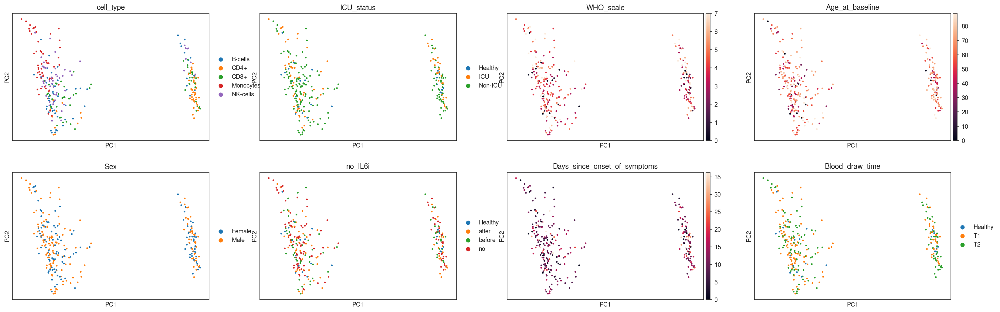

In [28]:
fig = sc.pl.pca(fluxes, color=['cell_type', 'ICU_status', 'WHO_scale', 'Age_at_baseline', 'Sex',
                               'no_IL6i', 'Days_since_onset_of_symptoms', 'Blood_draw_time'], size=30)

In [29]:
sc.pp.neighbors(fluxes)
sc.tl.umap(fluxes)
sc.tl.leiden(fluxes, resolution=0.1)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [30]:
# Make a column of average fluxes for each subsystem
for subsystem in fluxes.var['Subsystem']:
    fluxes.obs[subsystem] = np.mean(fluxes[:, fluxes.var['Subsystem']==subsystem].X, axis=1)

fluxes.obs.head()

,cell_type,Patient,ICU_status,IL6i_between_draws,no_IL6i,WHO_scale,Blood_draw_time,Sex,Age_at_baseline,Days_since_onset_of_symptoms,...,Nucleotide metabolism,NAD metabolism,Vitamin E metabolism,Inositol phosphate metabolism,Vitamin A metabolism,Vitamin B6 metabolism,C5-branched dibasic acid metabolism,CoA catabolism,Thiamine metabolism,Nucleotide sugar metabolism
CD4+_1-1,CD4+,1-1,Non-ICU,no,before,3.0,T1,Female,77,16.96,...,304.653198,355.713165,1000.0,116.408417,473.170746,0.000000,500.0,209.798706,84.410423,0.000000
CD4+_5-2,CD4+,5-2,ICU,after,no,5.0,T2,Male,75,17.96,...,337.695618,378.644928,1000.0,180.192017,160.975616,0.000000,500.0,106.364754,0.000000,20.697844
Monocytes_11-1,Monocytes,11-1,Non-ICU,no,before,3.0,T1,Male,89,12.21,...,345.535278,385.372070,1000.0,114.794571,226.829269,148.471130,250.0,159.758591,16.666666,0.000000
Monocytes_11-2,Monocytes,11-2,Non-ICU,no,after,3.0,T2,Male,89,14.21,...,788.255493,402.955841,1000.0,227.982224,287.686127,156.819672,0.0,259.271332,0.000000,31.239960
Monocytes_12-1,Monocytes,12-1,Non-ICU,no,before,4.0,T1,Female,73,34.25,...,269.533691,407.005524,1000.0,161.606705,299.114349,145.111374,500.0,215.840088,0.000000,0.000000


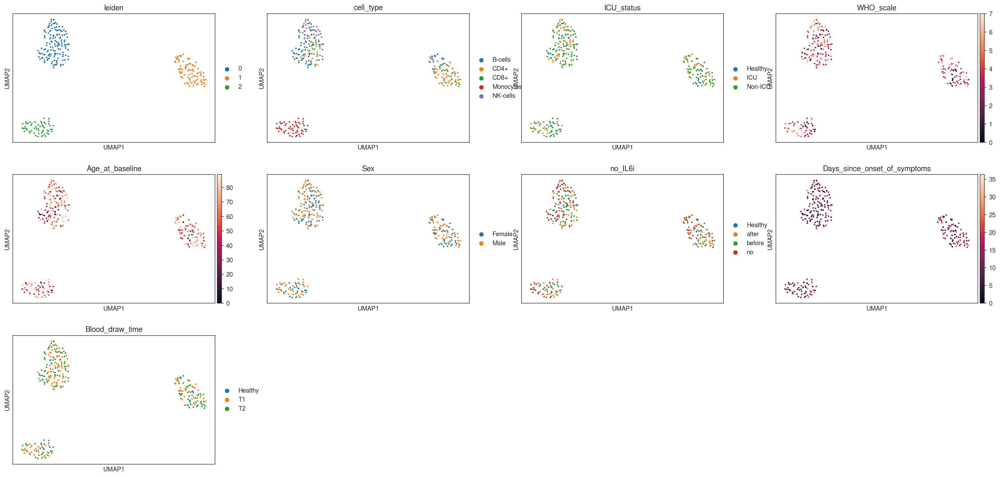

In [31]:
sns.set_style('ticks', rc={'font':'FreeSans', 'font.family':'sans-serif', 'font.sans-serif':'FreeSans'})
fig = sc.pl.umap(fluxes, color=['leiden', 'cell_type', 'ICU_status', 'WHO_scale', 'Age_at_baseline', 'Sex',
                                'no_IL6i', 'Days_since_onset_of_symptoms', 'Blood_draw_time'], size=25, use_raw=False)

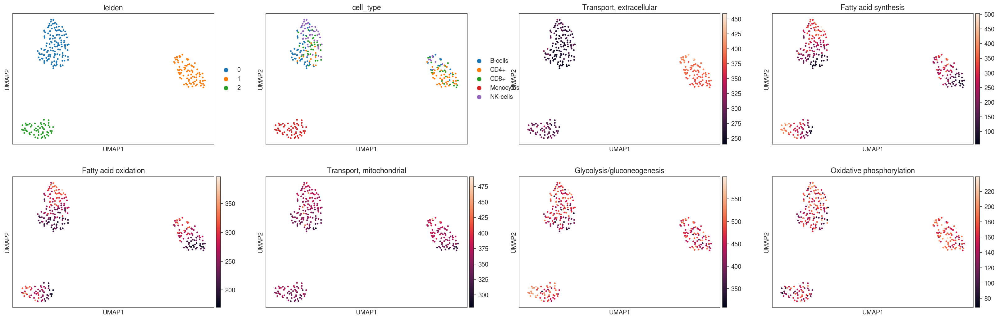

In [32]:
sc.pl.umap(fluxes, color=['leiden', 'cell_type', 'Transport, extracellular', 'Fatty acid synthesis', 'Fatty acid oxidation',
                         'Transport, mitochondrial', 'Glycolysis/gluconeogenesis', 'Oxidative phosphorylation'], size=30)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:06)


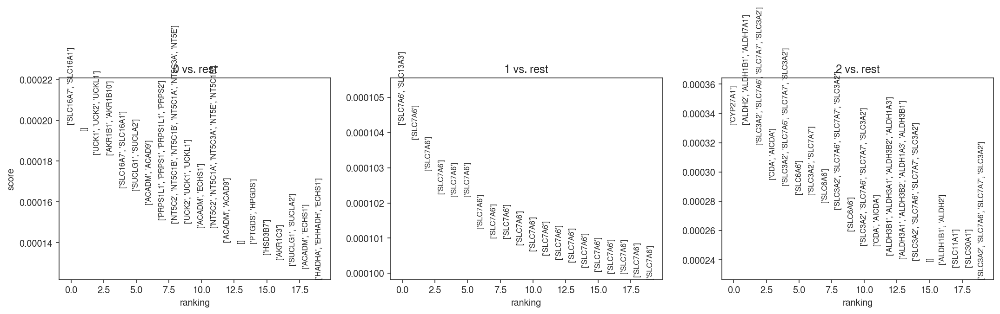

In [33]:
sc.tl.rank_genes_groups(fluxes, groupby='leiden', use_raw=False, n_genes=25, method='logreg')
sc.pl.rank_genes_groups(fluxes, gene_symbols='Genes symbols', sharey=False)

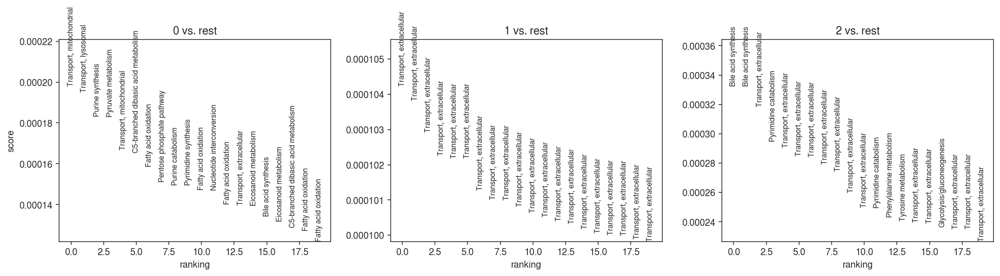

In [34]:
sc.pl.rank_genes_groups(fluxes, gene_symbols='Subsystem', sharey=False)

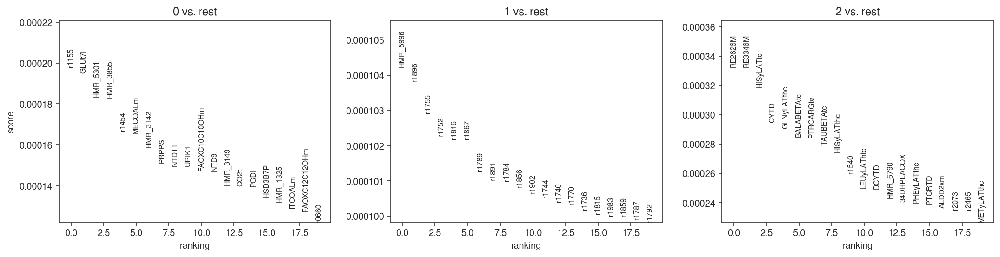

In [35]:
sc.pl.rank_genes_groups(fluxes, sharey=False)

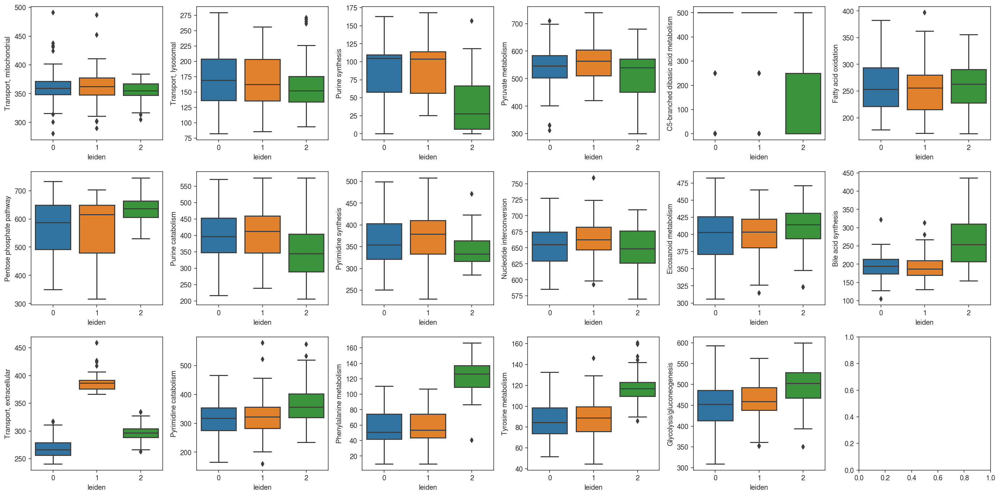

In [36]:
top_subsystems = ['Transport, mitochondrial', 'Transport, lysosomal',
                  'Purine synthesis', 'Pyruvate metabolism', 'C5-branched dibasic acid metabolism', 
                  'Fatty acid oxidation', 'Pentose phosphate pathway', 'Purine catabolism', 
                  'Pyrimidine synthesis', 'Nucleotide interconversion', 'Eicosanoid metabolism', 
                  'Bile acid synthesis', 'Transport, extracellular', 'Pyrimidine catabolism', 
                  'Phenylalanine metabolism', 'Tyrosine metabolism', 'Glycolysis/gluconeogenesis']
f, axes = plt.subplots(3, 6, figsize=(20, 10), sharex=False, sharey=False)
k = 0
for i in range(3):
    for j in range(6):
        if k >= len(top_subsystems):
            break
        f = sns.boxplot(x=fluxes.obs['leiden'], y=fluxes.obs[top_subsystems[k]], ax=axes[i, j])
        k += 1
        
plt.tight_layout()

In [37]:
# Statistical test
for s in top_subsystems:
    a = fluxes[fluxes.obs['leiden']=='0'].obs
    b = fluxes[fluxes.obs['leiden']=='1'].obs
    c = fluxes[fluxes.obs['leiden']=='2'].obs
    print(s + ': Between leiden 0 and leiden 1: p = ' + str(ttest_ind(a[s], b[s])[1]) + '\n')
    print(s + ': Between leiden 1 and leiden 2: p = ' + str(ttest_ind(b[s], c[s])[1]) + '\n')
    print(s + ': Between leiden 0 and leiden 2: p = ' + str(ttest_ind(a[s], c[s])[1]) + '\n')

Transport, mitochondrial: Between leiden 0 and leiden 1: p = 0.9564895390965765

Transport, mitochondrial: Between leiden 1 and leiden 2: p = 0.16996309904681606

Transport, mitochondrial: Between leiden 0 and leiden 2: p = 0.09899754589126747

Transport, lysosomal: Between leiden 0 and leiden 1: p = 0.8599143928767224

Transport, lysosomal: Between leiden 1 and leiden 2: p = 0.2622413167791672

Transport, lysosomal: Between leiden 0 and leiden 2: p = 0.1907653769685659

Purine synthesis: Between leiden 0 and leiden 1: p = 0.888205389887742

Purine synthesis: Between leiden 1 and leiden 2: p = 1.664366066683235e-14

Purine synthesis: Between leiden 0 and leiden 2: p = 1.235393175472429e-15

Pyruvate metabolism: Between leiden 0 and leiden 1: p = 0.08846813901481056

Pyruvate metabolism: Between leiden 1 and leiden 2: p = 0.0005710160611915409

Pyruvate metabolism: Between leiden 0 and leiden 2: p = 0.0201069264801814

C5-branched dibasic acid metabolism: Between leiden 0 and leiden 1: 

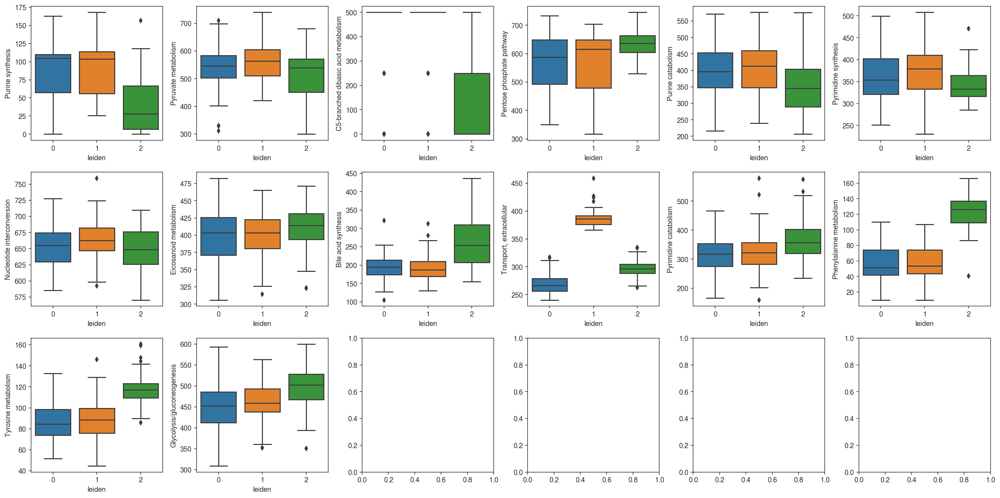

In [38]:
# Re-plot just the significant ones
top_subsystems = ['Purine synthesis', 'Pyruvate metabolism', 'C5-branched dibasic acid metabolism', 
                  'Pentose phosphate pathway', 'Purine catabolism', 
                  'Pyrimidine synthesis', 'Nucleotide interconversion', 'Eicosanoid metabolism', 
                  'Bile acid synthesis', 'Transport, extracellular', 'Pyrimidine catabolism', 
                  'Phenylalanine metabolism', 'Tyrosine metabolism', 'Glycolysis/gluconeogenesis']
f, axes = plt.subplots(3, 6, figsize=(20, 10), sharex=False, sharey=False)
k = 0
for i in range(3):
    for j in range(6):
        if k >= len(top_subsystems):
            break
        f = sns.boxplot(x=fluxes.obs['leiden'], y=fluxes.obs[top_subsystems[k]], ax=axes[i, j])
        k += 1
        
plt.tight_layout()

In [39]:
# Save this file
#fluxes.write(master_dir + 'output/fluxes-clustered-all_cell_types.h5ad')

### Composition of each flux cluster by cell type

In [40]:
#plot_bar(fluxes, 'leiden', 'cell_type', fluxes.obs, 'Frequency', 
#         master_dir + 'output/flux_analysis', xorder=['0', '1', '2'])

## Flux analysis integration for individual cell types

### CD4

computing PCA
    with n_comps=50
    finished (0:00:00)


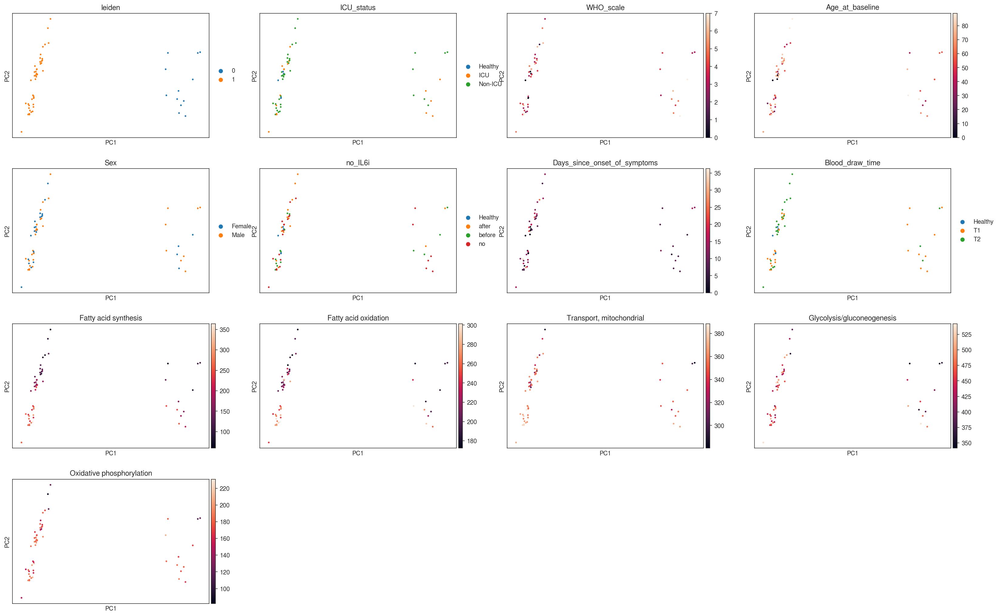

In [41]:
# Flux analysis per cell type?
def pca_1type(celltype):
    fluxes_type = fluxes[fluxes.obs['cell_type']==celltype]
    sc.tl.pca(fluxes_type, svd_solver='arpack')
    sc.pl.pca(fluxes_type, color=['leiden', 'ICU_status', 'WHO_scale', 'Age_at_baseline', 'Sex',
                                    'no_IL6i', 'Days_since_onset_of_symptoms', 'Blood_draw_time',
                                     'Fatty acid synthesis', 'Fatty acid oxidation',
                                     'Transport, mitochondrial', 'Glycolysis/gluconeogenesis', 
                                     'Oxidative phosphorylation'], size=30)
    return fluxes_type

def umap_1type(fluxes_type, celltype):
    #fluxes_type = fluxes[fluxes.obs['cell_type']==celltype]
    sc.pp.neighbors(fluxes_type)
    sc.tl.umap(fluxes_type)
    sc.tl.leiden(fluxes_type, resolution=0.1)
    fig = sc.pl.umap(fluxes_type, color=['leiden', 'ICU_status', 'WHO_scale', 'Age_at_baseline', 'Sex',
                                        'no_IL6i', 'Days_since_onset_of_symptoms', 'Blood_draw_time',
                                        'Fatty acid synthesis', 'Fatty acid oxidation',
                                         'Transport, mitochondrial', 'Glycolysis/gluconeogenesis', 
                                         'Oxidative phosphorylation'], size=30, use_raw=False)
    return fluxes_type

def rank_1type(fluxes_type, celltype):
    #fluxes_type = fluxes[fluxes.obs['cell_type']==celltype]
    sc.pp.neighbors(fluxes_type)
    sc.tl.umap(fluxes_type)
    sc.tl.leiden(fluxes_type, resolution=0.1)
    sc.tl.rank_genes_groups(fluxes_type, groupby='leiden', method='wilcoxon')
    #sc.pl.rank_genes_groups(fluxes_type, gene_symbols='Genes symbols', sharey=False)
    sc.pl.rank_genes_groups(fluxes_type, gene_symbols='Subsystem', sharey=False)
    return fluxes_type

def save_1type(fluxes_type, celltype):
    fluxes_type.write(master_dir + 'output/fluxes-clustered-' + celltype + '.h5ad')
    
fluxes_cd4 = pca_1type('CD4+')

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


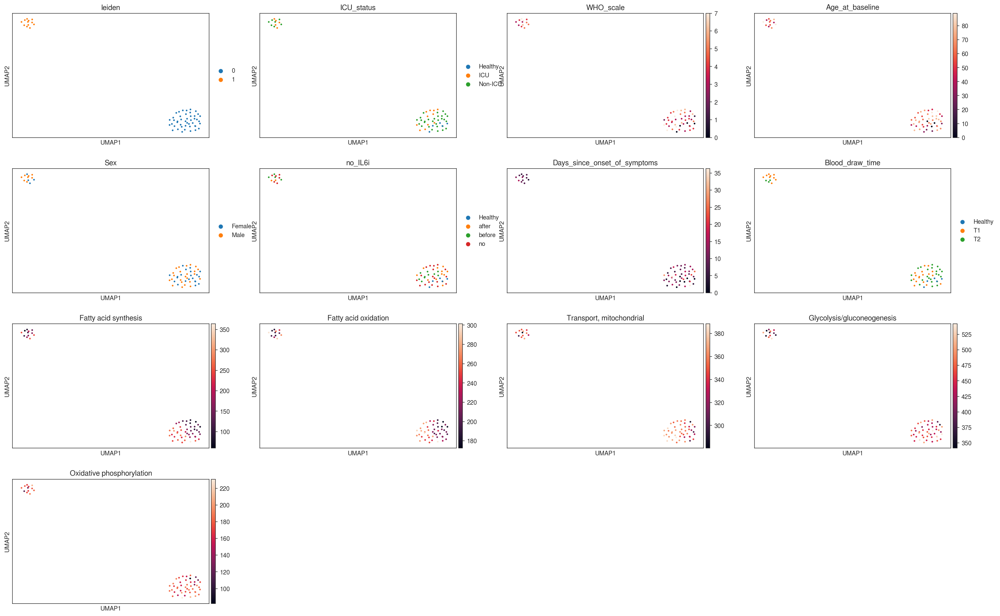

In [42]:
fluxes_cd4 = umap_1type(fluxes_cd4, 'CD4+')

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:404: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:405: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:404: RuntimeWarning: invalid value encountered in true_divide
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: divide by zero encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/plo

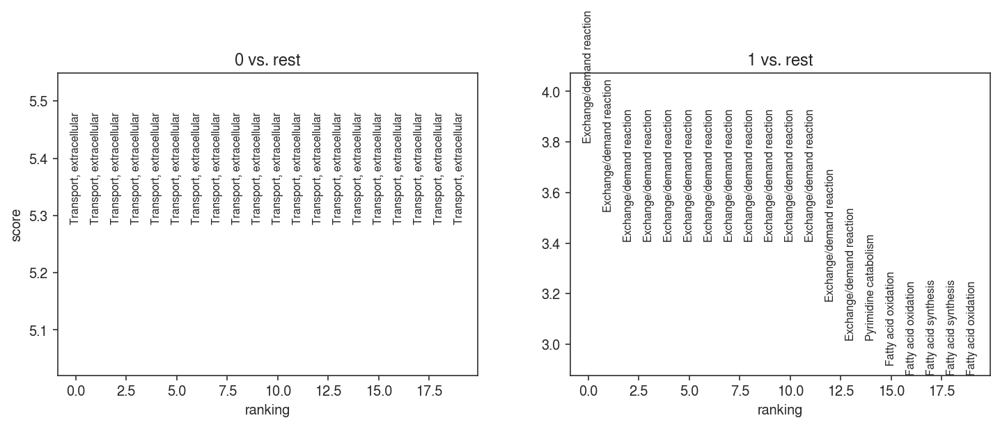

In [43]:
fluxes_cd4 = rank_1type(fluxes_cd4, 'CD4+')

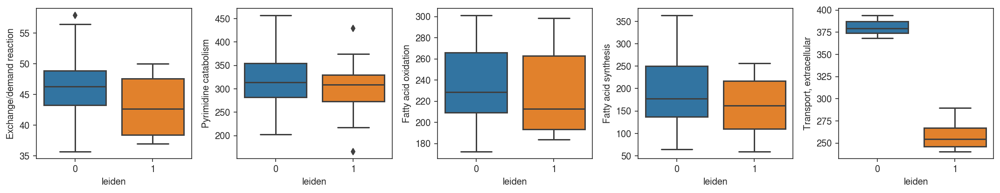

In [44]:
top_subsystems = ['Exchange/demand reaction', 'Pyrimidine catabolism',
                              'Fatty acid oxidation', 'Fatty acid synthesis', 'Transport, extracellular']
f, axes = plt.subplots(1, 5, figsize=(15, 3), sharex=False, sharey=False)
for i, s in enumerate(top_subsystems):
    f = sns.boxplot(x=fluxes_cd4.obs['leiden'], y=fluxes_cd4.obs[s], ax=axes[i])
    
plt.tight_layout()

In [45]:
# Statistical test
for s in top_subsystems:
    a = fluxes_cd4[fluxes_cd4.obs['leiden']=='0'].obs
    b = fluxes_cd4[fluxes_cd4.obs['leiden']=='1'].obs
    #c = fluxes[fluxes.obs['leiden']=='2'].obs
    print(s + ': Between leiden 0 and leiden 1: p = ' + str(ttest_ind(a[s], b[s])[1]) + '\n')
    #print(s + ': Between leiden 1 and leiden 2: p = ' + str(ttest_ind(b[s], c[s])[1]) + '\n')

Exchange/demand reaction: Between leiden 0 and leiden 1: p = 0.06346338926174114

Pyrimidine catabolism: Between leiden 0 and leiden 1: p = 0.47435681904729254

Fatty acid oxidation: Between leiden 0 and leiden 1: p = 0.5928025214601643

Fatty acid synthesis: Between leiden 0 and leiden 1: p = 0.2173482814758217

Transport, extracellular: Between leiden 0 and leiden 1: p = 6.162208673417137e-40



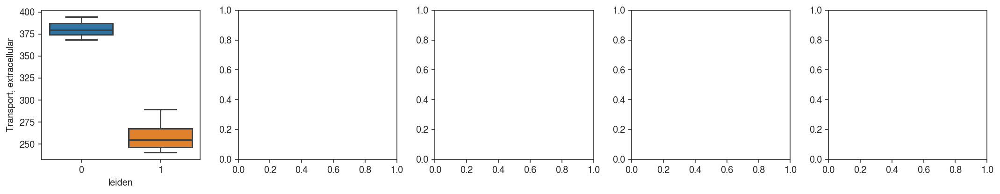

In [46]:
top_subsystems = ['Transport, extracellular']
f, axes = plt.subplots(1, 5, figsize=(15, 3), sharex=False, sharey=False)
for i, s in enumerate(top_subsystems):
    f = sns.boxplot(x=fluxes_cd4.obs['leiden'], y=fluxes_cd4.obs[s], ax=axes[i])
    
plt.tight_layout()

In [47]:
#plot_bar(fluxes_cd4, 'ICU_status', 'leiden', fluxes_cd4.obs, 'Frequency', 
#         master_dir + 'output/flux_analysis', xorder=['Healthy', 'Non-ICU', 'ICU'])

In [48]:
# Statistical significance of frequencies
#freq_cd4 = get_frequency(fluxes_cd4.obs, 'ICU_status', 'leiden')
#pd.DataFrame(freq_cd4.apply(lambda col: spearmanr(col, fluxes.obs['WHO_scale']))) Spearman won't work here
freq_cd4 = get_frequency(fluxes_cd4.obs, 'ICU_status', 'leiden')
print('Leiden 0 between group Healthy and non-ICU: ' + 
      str(chisquare([freq_cd4.loc['Healthy', '0'], freq_cd4.loc['Non-ICU', '0']], 
                    [sum(freq_cd4['0']) / 3, sum(freq_cd4['0']) / 3])[1]))
print('Leiden 0 between group Non-ICU and ICU: ' + 
      str(chisquare([freq_cd4.loc['Non-ICU', '0'], freq_cd4.loc['ICU', '0']],
                   [sum(freq_cd4['0']) / 3, sum(freq_cd4['0']) / 3])[1]))

Leiden 0 between group Healthy and non-ICU: 3.240414152989597e-05
Leiden 0 between group Non-ICU and ICU: 0.0005409318848316241


In [49]:
#save_1type(fluxes_cd4, 'CD4+')

### CD8

computing PCA
    with n_comps=50
    finished (0:00:00)


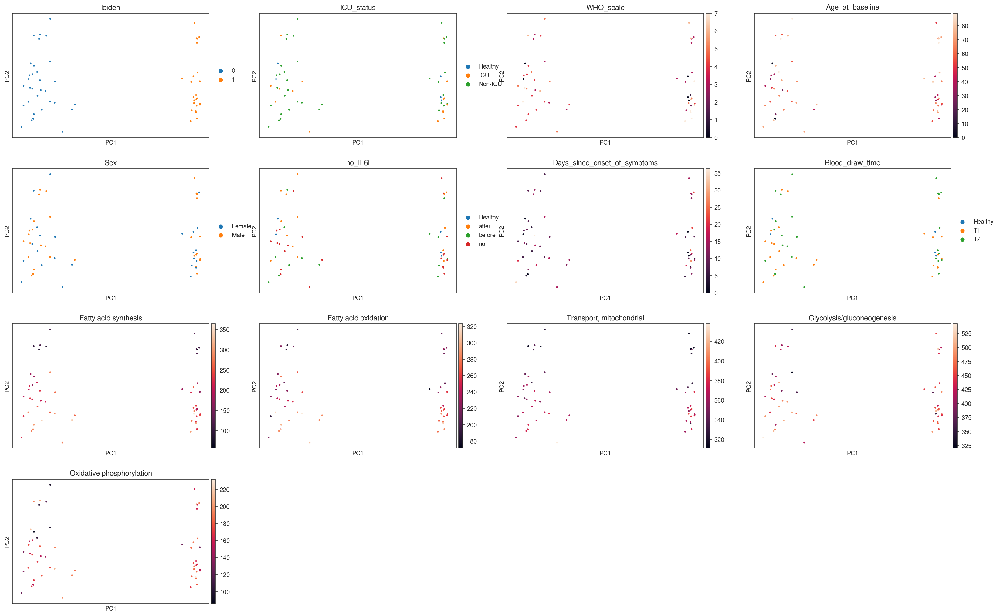

In [50]:
fluxes_cd8 = pca_1type('CD8+')

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


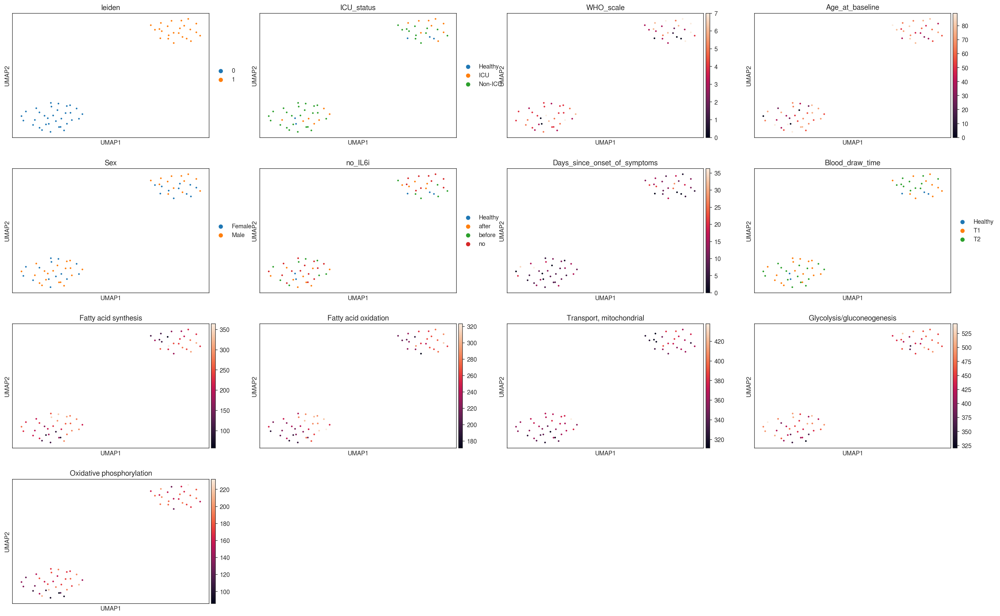

In [51]:
fluxes_cd8 = umap_1type(fluxes_cd8, 'CD8+')

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:404: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:405: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:404: RuntimeWarning: invalid value encountered in true_divide
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: divide by zero encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


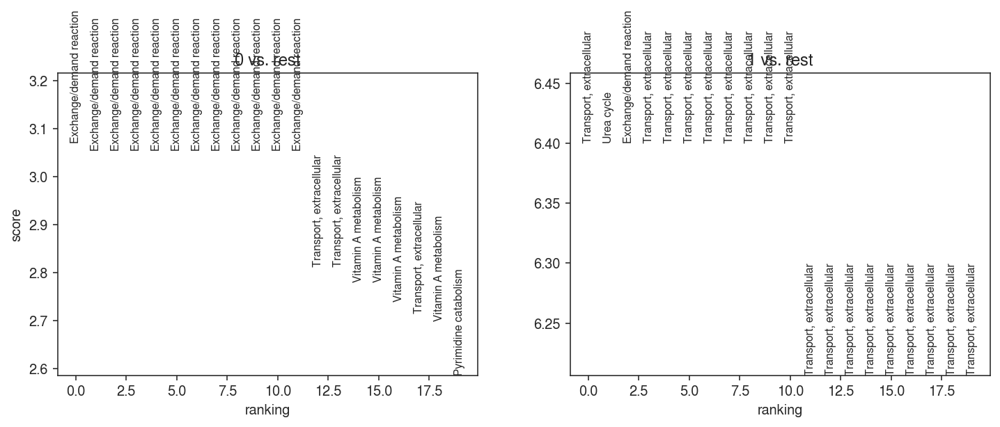

In [52]:
fluxes_cd8 = rank_1type(fluxes_cd8, 'CD8+')

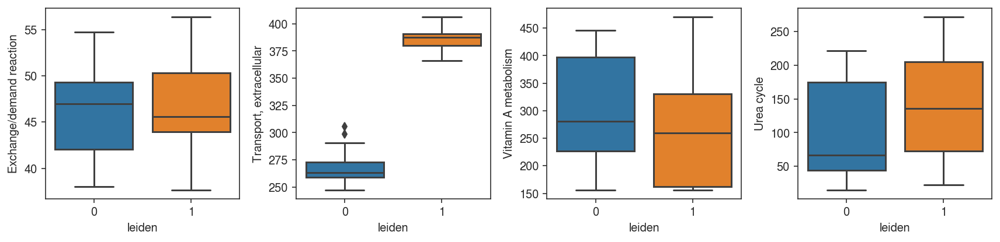

In [53]:
top_subsystems = ['Exchange/demand reaction', 'Transport, extracellular',
                              'Vitamin A metabolism', 'Urea cycle']
f, axes = plt.subplots(1, 4, figsize=(12, 3), sharex=False, sharey=False)
for i, s in enumerate(top_subsystems):
    f = sns.boxplot(x=fluxes_cd8.obs['leiden'], y=fluxes_cd8.obs[s], ax=axes[i])
    
plt.tight_layout()

In [54]:
# Statistical test
for s in top_subsystems:
    a = fluxes_cd8[fluxes_cd8.obs['leiden']=='0'].obs
    b = fluxes_cd8[fluxes_cd8.obs['leiden']=='1'].obs
    #c = fluxes[fluxes.obs['leiden']=='2'].obs
    print(s + ': Between leiden 0 and leiden 1: p = ' + str(ttest_ind(a[s], b[s])[1]) + '\n')
    #print(s + ': Between leiden 1 and leiden 2: p = ' + str(ttest_ind(b[s], c[s])[1]) + '\n')

Exchange/demand reaction: Between leiden 0 and leiden 1: p = 0.4452971701998861

Transport, extracellular: Between leiden 0 and leiden 1: p = 9.018363649180069e-41

Vitamin A metabolism: Between leiden 0 and leiden 1: p = 0.3677548415004458

Urea cycle: Between leiden 0 and leiden 1: p = 0.08425387505308066



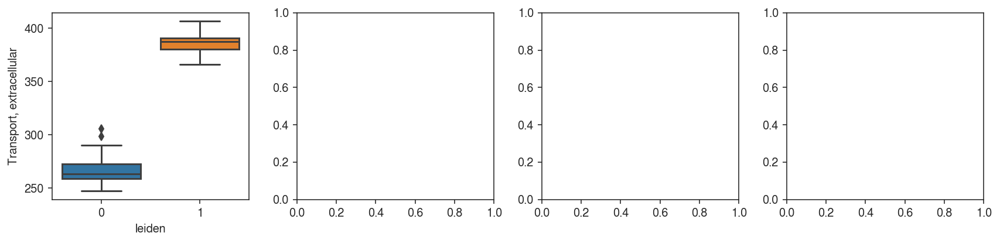

In [55]:
# Plot just the significant ones
top_subsystems = ['Transport, extracellular']
f, axes = plt.subplots(1, 4, figsize=(12, 3), sharex=False, sharey=False)
for i, s in enumerate(top_subsystems):
    f = sns.boxplot(x=fluxes_cd8.obs['leiden'], y=fluxes_cd8.obs[s], ax=axes[i])
    
plt.tight_layout()

In [56]:
plot_bar(fluxes_cd8, 'ICU_status', 'leiden', fluxes_cd8.obs, 'Frequency', 
         master_dir + 'output/flux_analysis', xorder=['Healthy', 'Non-ICU', 'ICU'])

In [57]:
# Statistical significance of frequencies
#freq_cd4 = get_frequency(fluxes_cd4.obs, 'ICU_status', 'leiden')
#pd.DataFrame(freq_cd4.apply(lambda col: spearmanr(col, fluxes.obs['WHO_scale']))) Spearman won't work here
freq_cd8 = get_frequency(fluxes_cd8.obs, 'ICU_status', 'leiden')
print('Leiden 0 between group Healthy and non-ICU: ' + 
      str(chisquare([freq_cd8.loc['Healthy', '0'], freq_cd8.loc['Non-ICU', '0']], 
                    [sum(freq_cd8['0']) / 3, sum(freq_cd8['0']) / 3])[1]))
print('Leiden 0 between group Non-ICU and ICU: ' + 
      str(chisquare([freq_cd8.loc['Non-ICU', '0'], freq_cd8.loc['ICU', '0']],
                   [sum(freq_cd8['0']) / 3, sum(freq_cd8['0']) / 3])[1]))

Leiden 0 between group Healthy and non-ICU: 8.192222958196102e-06
Leiden 0 between group Non-ICU and ICU: 0.00016028959150964604


In [58]:
#save_1type(fluxes_cd8, 'CD8+')

### NK

computing PCA
    with n_comps=50
    finished (0:00:00)


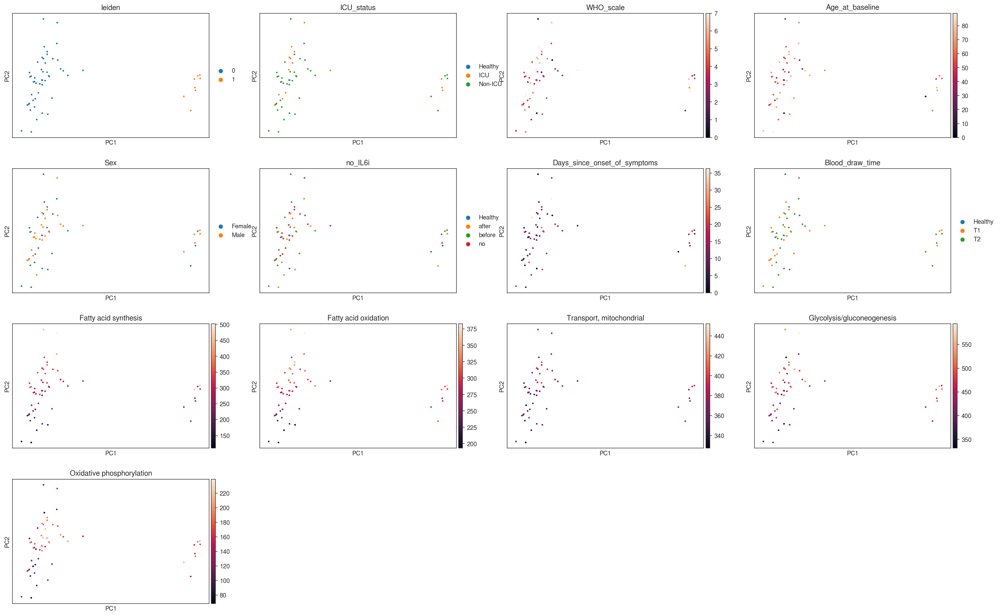

In [59]:
fluxes_nk = pca_1type('NK-cells')

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


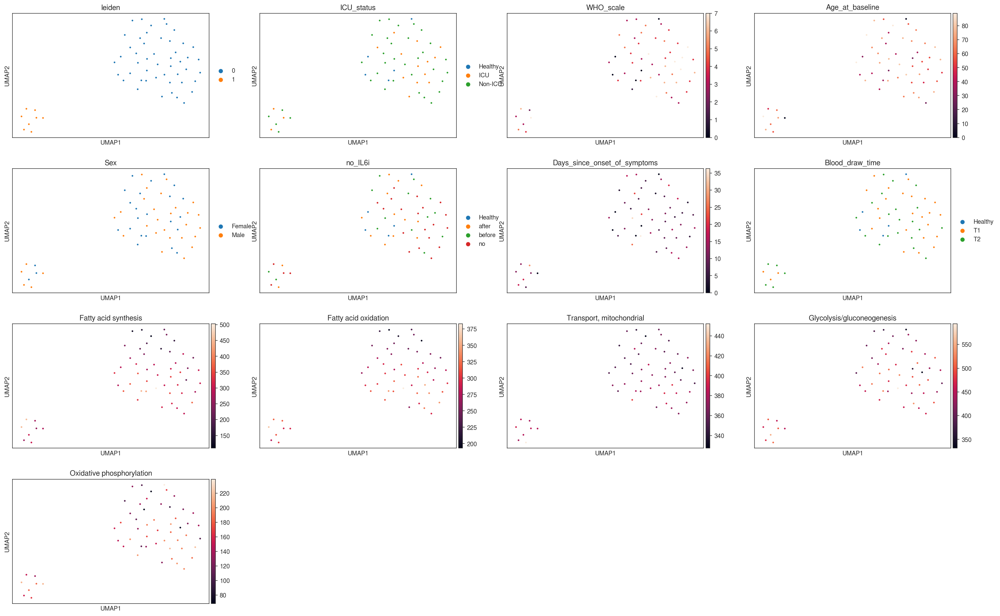

In [60]:
fluxes_nk = umap_1type(fluxes_nk, 'NK-cells')

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:404: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:405: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:404: RuntimeWarning: invalid value encountered in true_divide
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: divide by zero encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


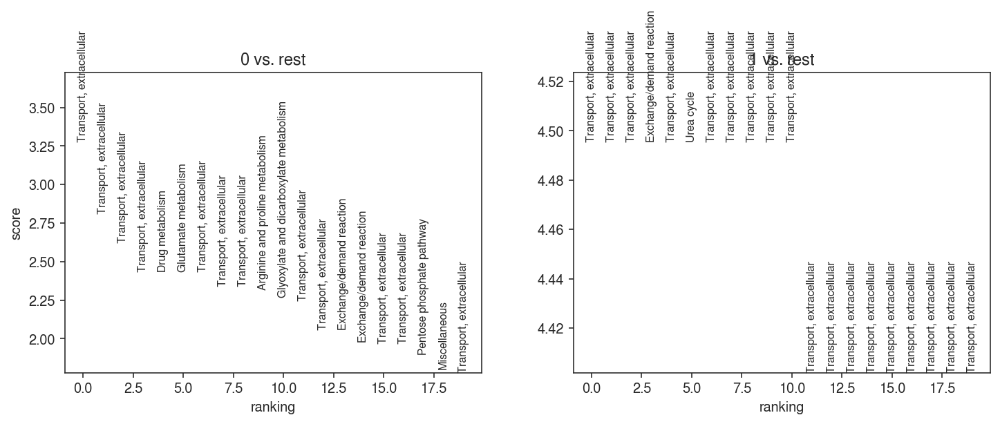

In [61]:
fluxes_nk = rank_1type(fluxes_nk, 'NK-cells')

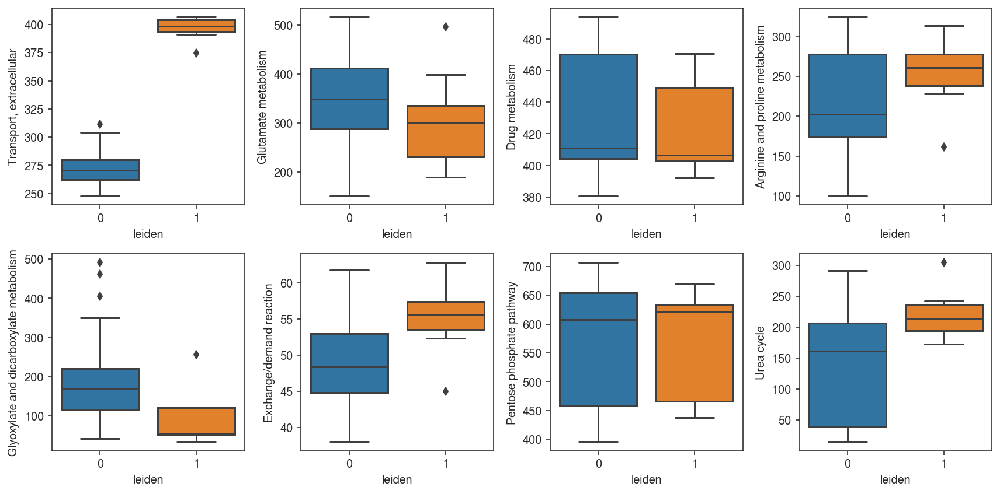

In [62]:
top_subsystems = ['Transport, extracellular', 'Glutamate metabolism',
                  'Drug metabolism', 'Arginine and proline metabolism',
                 'Glyoxylate and dicarboxylate metabolism', 'Exchange/demand reaction', 
                 'Pentose phosphate pathway', 'Urea cycle']
f, axes = plt.subplots(2, 4, figsize=(12, 6), sharex=False, sharey=False)

k = 0
for i in range(2):
    for j in range(4):
        f = sns.boxplot(x=fluxes_nk.obs['leiden'], y=fluxes_nk.obs[top_subsystems[k]], ax=axes[i, j])
        k += 1
plt.tight_layout()

In [63]:
# Statistical test
for s in top_subsystems:
    a = fluxes_nk[fluxes_nk.obs['leiden']=='0'].obs
    b = fluxes_nk[fluxes_nk.obs['leiden']=='1'].obs
    #c = fluxes[fluxes.obs['leiden']=='2'].obs
    print(s + ': Between leiden 0 and leiden 1: p = ' + str(ttest_ind(a[s], b[s])[1]) + '\n')
    #print(s + ': Between leiden 1 and leiden 2: p = ' + str(ttest_ind(b[s], c[s])[1]) + '\n')

Transport, extracellular: Between leiden 0 and leiden 1: p = 2.7309890923665087e-31

Glutamate metabolism: Between leiden 0 and leiden 1: p = 0.317433753610746

Drug metabolism: Between leiden 0 and leiden 1: p = 0.6702939556240625

Arginine and proline metabolism: Between leiden 0 and leiden 1: p = 0.12822312596514066

Glyoxylate and dicarboxylate metabolism: Between leiden 0 and leiden 1: p = 0.025475252885881945

Exchange/demand reaction: Between leiden 0 and leiden 1: p = 0.010959803267368357

Pentose phosphate pathway: Between leiden 0 and leiden 1: p = 0.9570689519524878

Urea cycle: Between leiden 0 and leiden 1: p = 0.006117163020707078



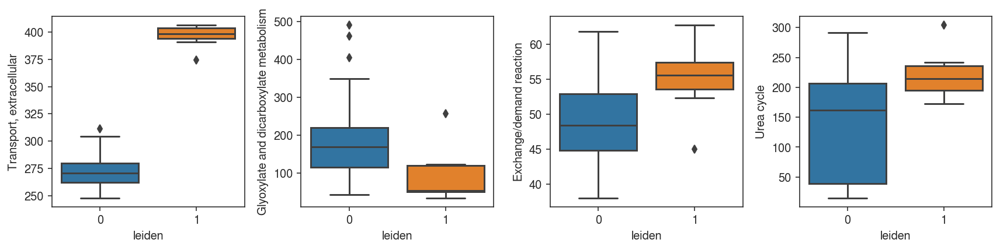

In [64]:
top_subsystems = ['Transport, extracellular', 'Glyoxylate and dicarboxylate metabolism', 'Exchange/demand reaction', 
                 'Urea cycle']
f, axes = plt.subplots(1, 4, figsize=(12, 3), sharex=False, sharey=False)

k = 0
for i in range(1):
    for j in range(4):
        f = sns.boxplot(x=fluxes_nk.obs['leiden'], y=fluxes_nk.obs[top_subsystems[k]], ax=axes[j])
        k += 1
plt.tight_layout()

In [65]:
plot_bar(fluxes_nk, 'ICU_status', 'leiden', fluxes_nk.obs, 'Frequency', 
         master_dir + 'output/flux_analysis', xorder=['Healthy', 'Non-ICU', 'ICU'])

In [66]:
# Statistical significance of frequencies
#freq_cd4 = get_frequency(fluxes_cd4.obs, 'ICU_status', 'leiden')
#pd.DataFrame(freq_cd4.apply(lambda col: spearmanr(col, fluxes.obs['WHO_scale']))) Spearman won't work here
freq_nk = get_frequency(fluxes_nk.obs, 'ICU_status', 'leiden')
print('Leiden 0 between group Healthy and non-ICU: ' + 
      str(chisquare([freq_nk.loc['Healthy', '0'], freq_nk.loc['Non-ICU', '0']], 
                    [sum(freq_nk['0']) / 3, sum(freq_nk['0']) / 3])[1]))
print('Leiden 0 between group Non-ICU and ICU: ' + 
      str(chisquare([freq_nk.loc['Non-ICU', '0'], freq_nk.loc['ICU', '0']],
                   [sum(freq_nk['0']) / 3, sum(freq_nk['0']) / 3])[1]))

Leiden 0 between group Healthy and non-ICU: 8.542221331979402e-06
Leiden 0 between group Non-ICU and ICU: 0.0003443111796750494


In [67]:
#save_1type(fluxes_nk, 'NK-cells')

### B

computing PCA
    with n_comps=50
    finished (0:00:00)


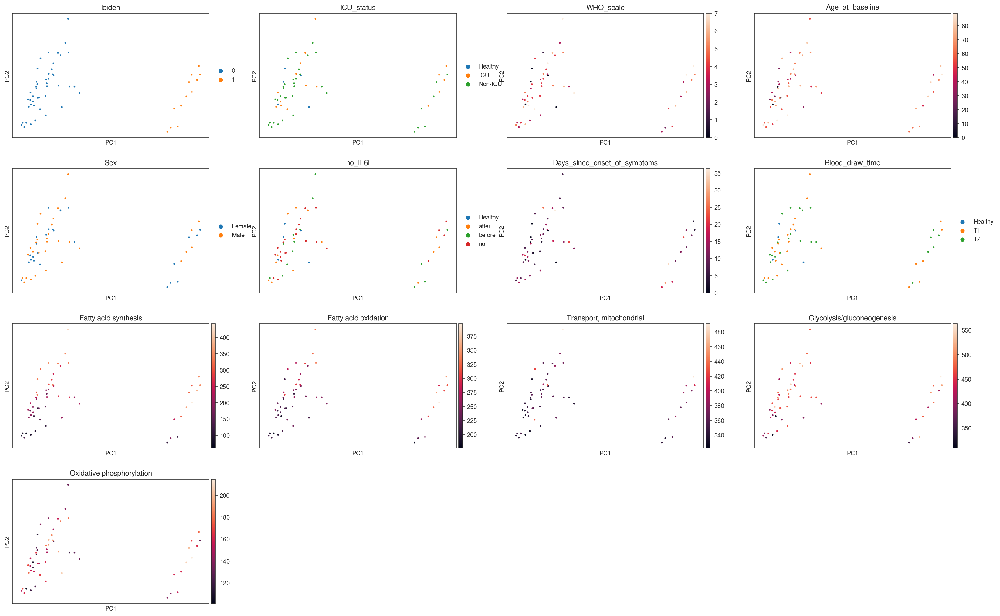

In [68]:
fluxes_b = pca_1type('B-cells')

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


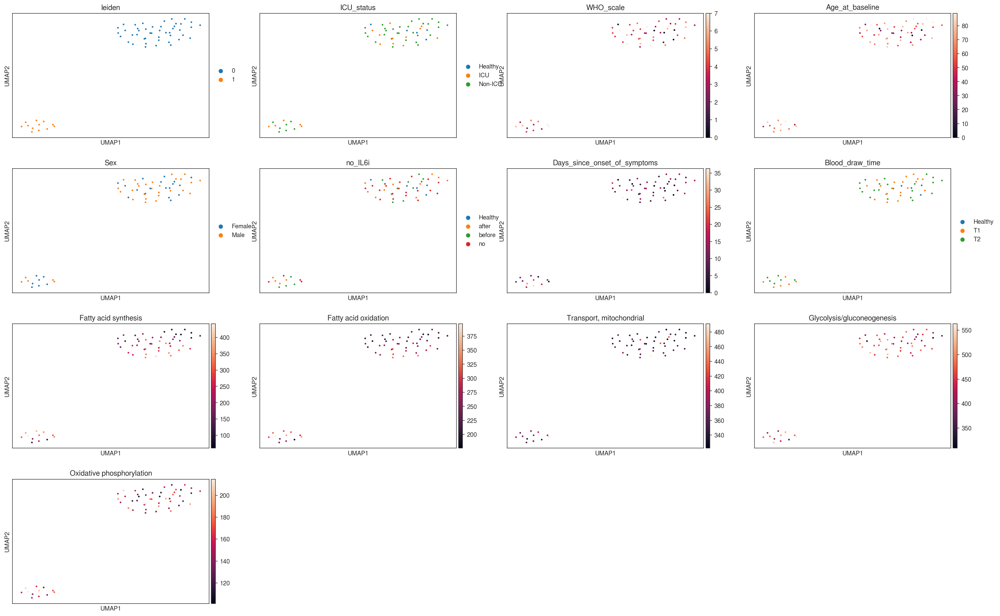

In [69]:
fluxes_b = umap_1type(fluxes_b, 'B-cells')

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:404: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:405: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:404: RuntimeWarning: invalid value encountered in true_divide
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: divide by zero encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


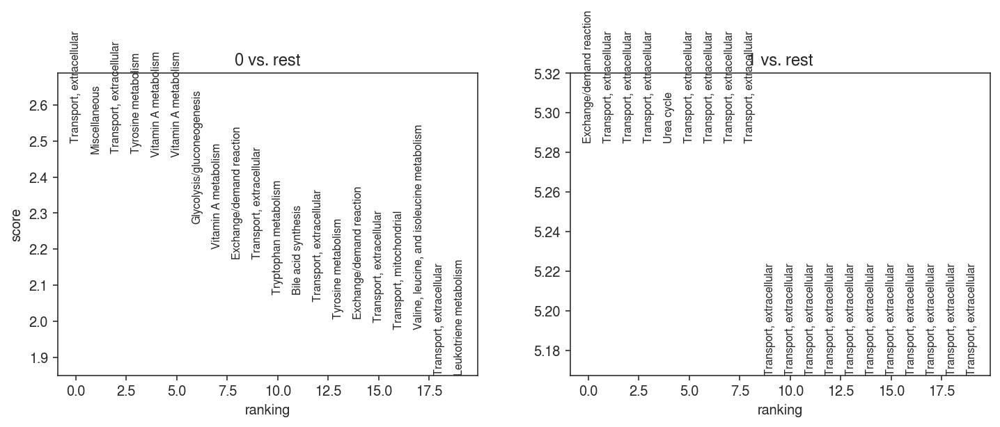

In [70]:
fluxes_b = rank_1type(fluxes_b, 'B-cells')

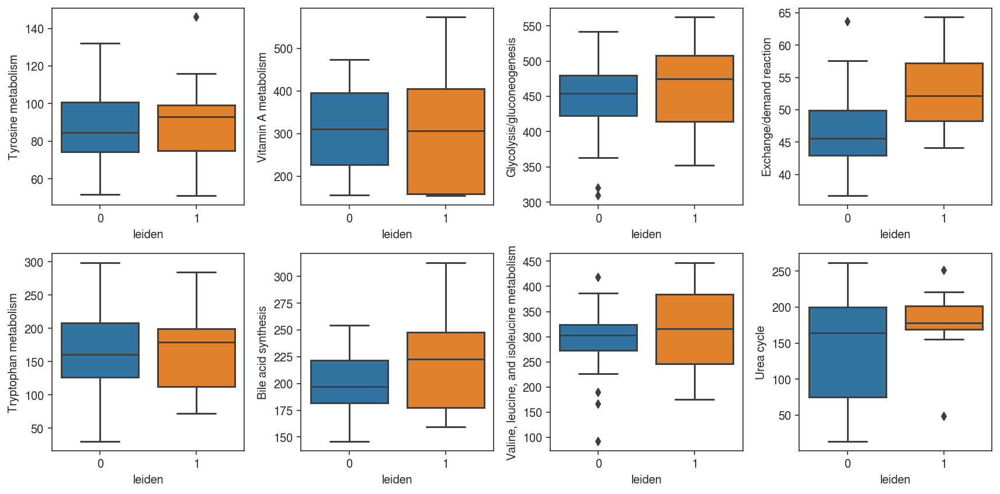

In [71]:
top_subsystems = ['Transport, extracellular', 'Tyrosine metabolism',
                              'Vitamin A metabolism', 'Glycolysis/gluconeogenesis', 'Exchange/demand reaction',
                  'Tryptophan metabolism', 'Bile acid synthesis', 'Valine, leucine, and isoleucine metabolism',
                  'Urea cycle']
f, axes = plt.subplots(2, 4, figsize=(12, 6), sharex=False, sharey=False)

k = 0
for i in range(2):
    for j in range(4):
        k += 1
        f = sns.boxplot(x=fluxes_b.obs['leiden'], y=fluxes_b.obs[top_subsystems[k]], ax=axes[i, j])
    
plt.tight_layout()

In [72]:
# Statistical test
for s in top_subsystems:
    a = fluxes_b[fluxes_b.obs['leiden']=='0'].obs
    b = fluxes_b[fluxes_b.obs['leiden']=='1'].obs
    #c = fluxes[fluxes.obs['leiden']=='2'].obs
    print(s + ': Between leiden 0 and leiden 1: p = ' + str(ttest_ind(a[s], b[s])[1]) + '\n')
    #print(s + ': Between leiden 1 and leiden 2: p = ' + str(ttest_ind(b[s], c[s])[1]) + '\n')

Transport, extracellular: Between leiden 0 and leiden 1: p = 1.2827858061150764e-27

Tyrosine metabolism: Between leiden 0 and leiden 1: p = 0.6231763980158103

Vitamin A metabolism: Between leiden 0 and leiden 1: p = 0.9237502108048073

Glycolysis/gluconeogenesis: Between leiden 0 and leiden 1: p = 0.4577909979990694

Exchange/demand reaction: Between leiden 0 and leiden 1: p = 0.0011407897867495612

Tryptophan metabolism: Between leiden 0 and leiden 1: p = 0.8478488903500911

Bile acid synthesis: Between leiden 0 and leiden 1: p = 0.047577523036464064

Valine, leucine, and isoleucine metabolism: Between leiden 0 and leiden 1: p = 0.43094778816046875

Urea cycle: Between leiden 0 and leiden 1: p = 0.1537653559467781



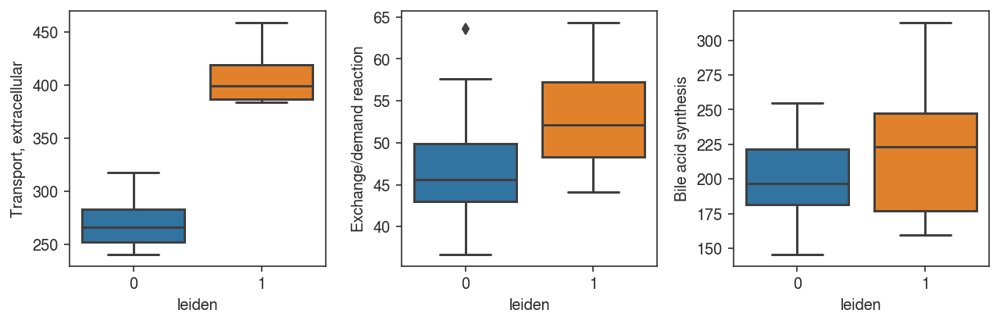

In [73]:
top_subsystems = ['Transport, extracellular', 'Exchange/demand reaction',
                  'Bile acid synthesis']
f, axes = plt.subplots(1, 3, figsize=(9, 3), sharex=False, sharey=False)

k = 0
for i in range(1):
    for j in range(3):
        f = sns.boxplot(x=fluxes_b.obs['leiden'], y=fluxes_b.obs[top_subsystems[k]], ax=axes[j])
        k += 1
    
plt.tight_layout()

In [74]:
plot_bar(fluxes_b, 'ICU_status', 'leiden', fluxes_b.obs, 'Frequency', 
         master_dir + 'output/flux_analysis', xorder=['Healthy', 'Non-ICU', 'ICU'])

In [75]:
# Statistical significance of frequencies
#freq_cd4 = get_frequency(fluxes_cd4.obs, 'ICU_status', 'leiden')
#pd.DataFrame(freq_cd4.apply(lambda col: spearmanr(col, fluxes.obs['WHO_scale']))) Spearman won't work here
freq_b = get_frequency(fluxes_b.obs, 'ICU_status', 'leiden')
print('Leiden 0 between group Healthy and non-ICU: ' + 
      str(chisquare([freq_b.loc['Healthy', '0'], freq_b.loc['Non-ICU', '0']], 
                    [sum(freq_b['0']) / 3, sum(freq_b['0']) / 3])[1]))
print('Leiden 0 between group Non-ICU and ICU: ' + 
      str(chisquare([freq_b.loc['Non-ICU', '0'], freq_b.loc['ICU', '0']],
                   [sum(freq_b['0']) / 3, sum(freq_b['0']) / 3])[1]))

Leiden 0 between group Healthy and non-ICU: 3.240414152989597e-05
Leiden 0 between group Non-ICU and ICU: 0.0005409318848316241


In [76]:
#save_1type(fluxes_b, 'B-cells')

### Monocyte

computing PCA
    with n_comps=50
    finished (0:00:00)


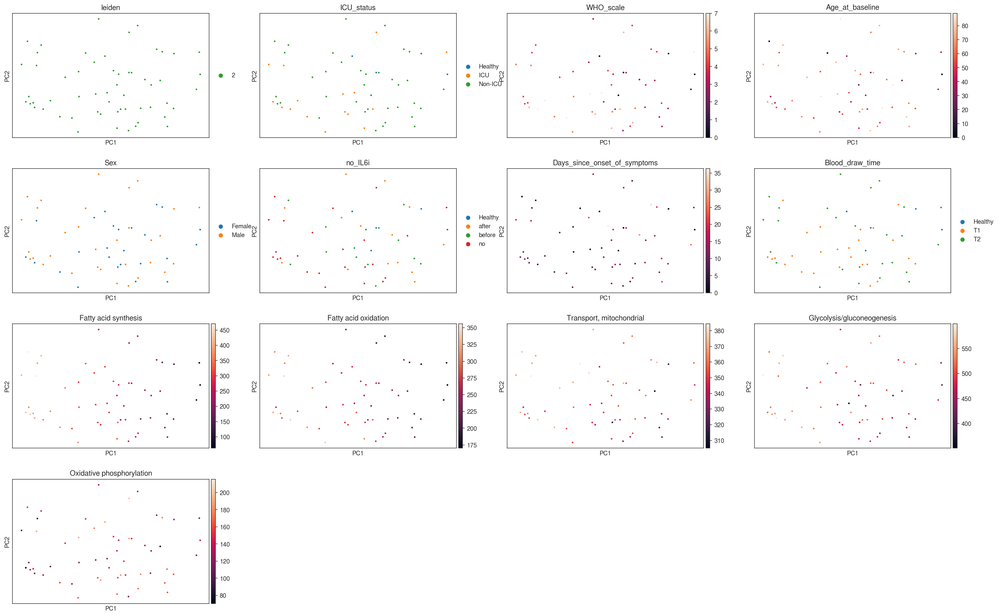

In [77]:
fluxes_mono = pca_1type('Monocytes')

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)
running Leiden clustering
    finished: found 1 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


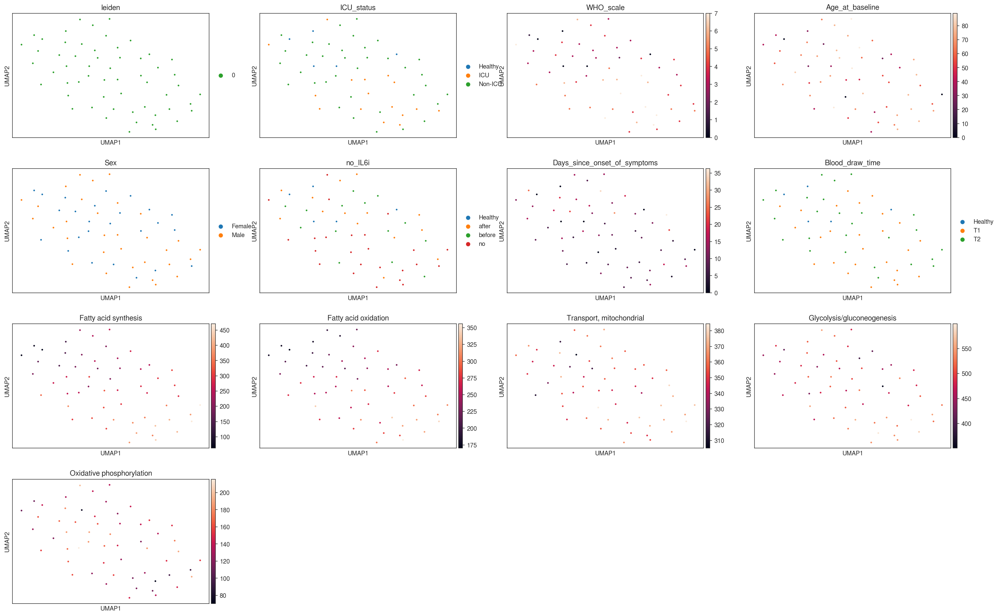

In [78]:
fluxes_mono = umap_1type(fluxes_mono, 'Monocytes')

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)
running Leiden clustering
    finished: found 1 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


/home/jwlee/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/jwlee/.local/lib/python3.8/site-packages/numpy/core/_methods.py:162: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/preprocessing/_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:311: RuntimeWarning: invalid value encountered in true_divide
  scores[group_index, :] = (
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:404: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/jwlee/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/__init__.py:308: UserWarning: Attempting to set identical bot

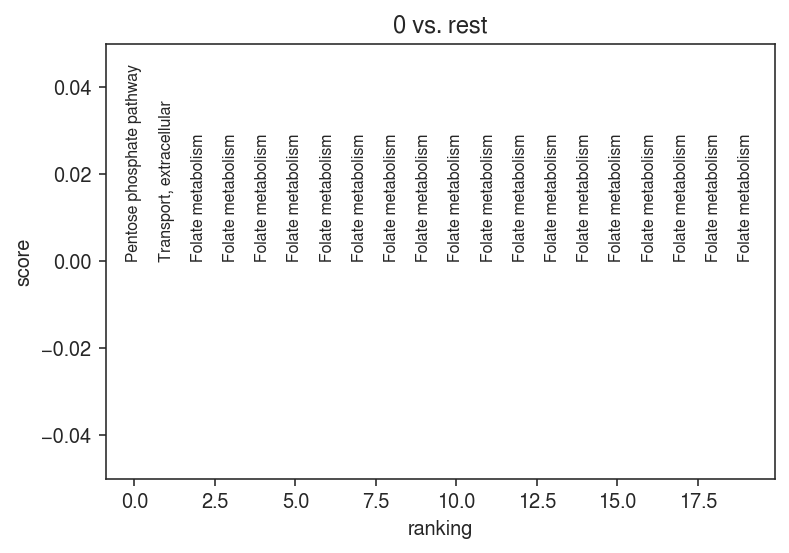

In [79]:
fluxes_mono = rank_1type(fluxes_mono, 'Monocytes')

In [80]:
#save_1type(fluxes_mono, 'Monocytes')

In [81]:
fluxes.obs.iloc[:, 11:] = fluxes.obs.iloc[:, 11:].fillna(0)
asdf = pd.DataFrame(fluxes.obs.apply(lambda col: spearmanr(col, fluxes.obs['WHO_scale'])))
#asdf.dropna(axis=1)

ValueError: fill value must be in categories

Thus, no correlation between anything and WHO scale

In [ ]:
spearmanr(fluxes.obs['Transport, lysosomal'], fluxes.obs['WHO_scale'])[0]

In [ ]:
spearmanr(fluxes.obs['WHO_scale'], fluxes.obs['WHO_scale'])

## Organizing per patient

In [82]:
fluxes_pt = sc.AnnData(X = np.zeros([len(fluxes.obs['Patient'].unique()), len(fluxes.var) * 5]))
fluxes_pt.obs = fluxes.obs.iloc[:, :-95].groupby('Patient').first().copy()
var = pd.DataFrame()
for celltype in fluxes.obs['cell_type'].unique():
    temp = fluxes.var.copy()
    temp.index = pd.Series(temp.index).apply(lambda x: str(x) + '_' + celltype)
    var = pd.concat([var, temp])
fluxes_pt.var = var

In [83]:
for i, celltype in enumerate(fluxes.obs['cell_type'].unique()):
    if celltype=='NK-cells': # One patient doesn't have NK cell samples
        missing = set(fluxes_pt.obs.index).difference(set(fluxes.obs[fluxes.obs['cell_type']==celltype]['Patient']))
        fluxes_pt.X[np.where(~fluxes_pt.obs.index.isin(missing)), len(fluxes.var) * i:(len(fluxes.var) * (i + 1))] = \
            fluxes.X[np.where(fluxes.obs['cell_type']==celltype), :]
    else:
        fluxes_pt.X[:, len(fluxes.var) * i:(len(fluxes.var) * (i + 1))] = \
            fluxes.X[np.where(fluxes.obs['cell_type']==celltype), :]

fluxes_pt

AnnData object with n_obs × n_vars = 57 × 41545
    obs: 'cell_type', 'ICU_status', 'IL6i_between_draws', 'no_IL6i', 'WHO_scale', 'Blood_draw_time', 'Sex', 'Age_at_baseline', 'Days_since_onset_of_symptoms', 'louvain', 'leiden'
    var: 'Subsystem', 'Genes associated with the reactions', 'Genes symbols'

computing PCA
    with n_comps=50
    finished (0:00:00)


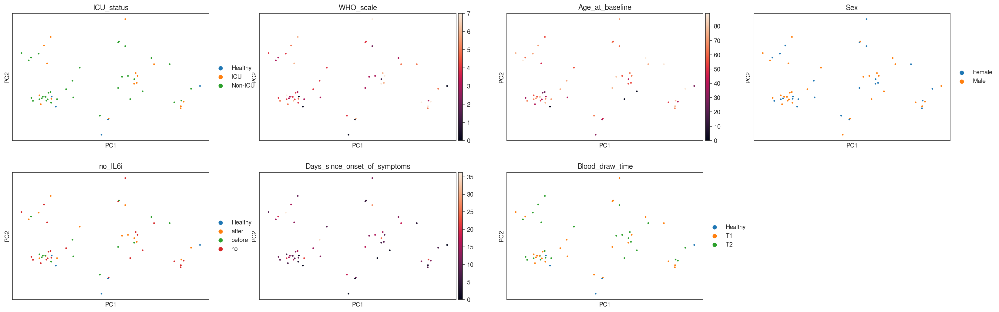

In [84]:
sc.tl.pca(fluxes_pt, svd_solver='arpack')
sc.pl.pca(fluxes_pt, size=30, color=['ICU_status', 'WHO_scale', 'Age_at_baseline', 'Sex',
                               'no_IL6i', 'Days_since_onset_of_symptoms', 'Blood_draw_time'])

In [85]:
sc.pp.neighbors(fluxes_pt)
sc.tl.umap(fluxes_pt)
sc.tl.louvain(fluxes_pt, resolution=0.1)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 1 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


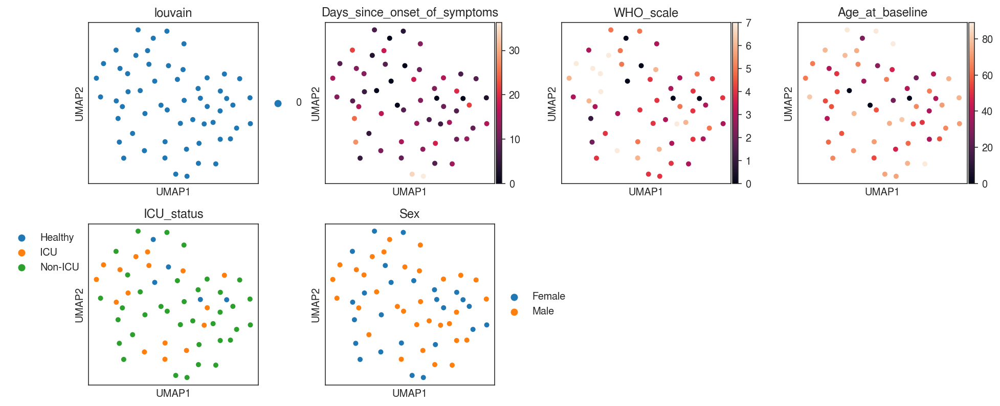

In [120]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (3, 3)}):
    axs = sc.pl.umap(fluxes_pt, color=['louvain', 'Days_since_onset_of_symptoms', 'WHO_scale', 
                                 'Age_at_baseline', 'ICU_status', 'Sex'], size=100, show=False)
    axs[-2].legend(bbox_to_anchor=(0,1),frameon=False)
    

In [77]:
# Save this per-patient flux
#fluxes_pt.write(master_dir + 'output/fluxes-by_patient.h5ad')

## Subsystem flux analysis

In [85]:
def subsystem_plot(adata_flux, celltype):
    patients_WHO = adata_flux.obs.sort_values(by='WHO_scale', axis=0).dropna(subset=['WHO_scale'])['Patient'].unique()
    adata_flux.obs.index = adata_flux.obs['Patient']
    df_p = adata_flux.obs.loc[patients_WHO]
    df_p = df_p.iloc[:, -95:]
    df_p = df_p.transpose()
    df_p = df_p.divide(np.mean(df_p, axis=1), axis=0).dropna()
    
    fig = plt.figure(figsize=(20, 20))
    sns.heatmap(df_p, cmap='viridis', vmax=5)
    
    # Other patient attributes
    adata_obs_by_patient = adata_flux.obs.copy().dropna(subset=['WHO_scale'])
    adata_obs_by_patient['WHO_scale'] = adata_obs_by_patient['WHO_scale'].astype(int)

    # Plotting the other patient attributes
    sns.set(style='white')
    #sns.set(style='ticks')
    sns.despine()

    f, axes = plt.subplots(3, 1, figsize=(25, 1.2), sharex=False, sharey=False)

    df = adata_obs_by_patient.loc[patients_WHO, ['ICU_status']]
    df['ICU_status'] = df['ICU_status'].map({'Healthy': 0, 'Non-ICU': 1, 'ICU': 2}).astype(int)
    fig = plt.figure(figsize=(16, 0.3))
    fig = sns.heatmap(df.transpose(), xticklabels=[''], yticklabels=[''],
                     cmap='plasma', ax=axes[0])

    df = adata_obs_by_patient.loc[patients_WHO, ['Age_at_baseline']]
    fig = plt.figure(figsize=(16, 0.3))
    fig = sns.heatmap(df.transpose(), xticklabels=[''], yticklabels=[''], vmin=0,
                     cmap='coolwarm', ax=axes[1])

    df = adata_obs_by_patient.loc[patients_WHO, ['Sex']]
    df['Sex'] = df['Sex'].map({'Female': 1, 'Male': 0}).astype(int)
    fig = plt.figure(figsize=(16, 0.3))
    fig = sns.heatmap(df.transpose(), xticklabels=patients_WHO, yticklabels=[''],
                     cmap='cool', ax=axes[2])

    df = adata_obs_by_patient.loc[patients_WHO, ['WHO_scale']]
    df['WHO_scale'] += 1 # Add 1 to all values in order to make all bars visible
    fig = plt.figure(figsize=(14, 0.5))
    oranges = cm.get_cmap('Oranges', 8)
    df['c'] = [oranges(s - 1) for s in df['WHO_scale']]
    fig = df['WHO_scale'].plot(kind='bar', color=df['c'], edgecolor='black', width=1)

    fig = plt.yticks([1, 8])
    fig = plt.xticks([])
    
    # For correlation, not using the statistically deleted values (need raw values)
    spr_corr = df_p.apply(lambda col: spearmanr(col, adata_obs_by_patient.loc[patients_WHO, ['WHO_scale']])[0], 
                          axis=1)
    spr_pvalues = df_p.apply(lambda col: spearmanr(col, adata_obs_by_patient.loc[patients_WHO, ['WHO_scale']])[1], 
                             axis=1)

    sig_pathways = pd.DataFrame([spr_corr, spr_pvalues]).transpose()
    sig_pathways = sig_pathways[sig_pathways.loc[:, 1]<0.05]
    sig_pathways.columns = ['Spearman', 'p-value']
    sig_pathways['Spearman_abs'] = abs(sig_pathways['Spearman'])
    sig_pathways['-log10(p)'] = -np.log10(sig_pathways['p-value'])
    sig_pathways = sig_pathways.sort_values(by='Spearman_abs', ascending=False)
    pd.DataFrame(sig_pathways).to_csv(master_dir + 'output/flux_analysis/' + celltype +
                                     '-all_cells' + '.csv')
    return (df_p, sig_pathways, patients_WHO)

def plot_sig_pathways(df_p, sig_pathways, patients_WHO):
    # Plot the top corresponding ones
    sns.set_style('white')
    sns.set_style('ticks')
    f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=False, sharey=False)
    sns.despine()

    k = 0
    x = adata_obs_by_patient.loc[patients_WHO, ['WHO_scale']]
    for i in range(2):
        for j in range(3):
            f = sns.regplot(x=x, y=df_p.loc[sig_pathways.index[k]], x_jitter=0.15, ax=axes[i, j])
            f.set_ylabel(sig_pathways.index[k])
            f.set_xlabel('WHO scale')
            f.set_xticks(range(8))
            k += 1

    plt.tight_layout()

In [86]:
def plot_corresponding(df_all, sig_pathways, patients_WHO, figsize=(15, 3), cmap='magma', **kwargs):
    # Plot the top corresponding ones
    df_p_corresponding = pd.DataFrame(df_all)
    df_p_corresponding.columns = pd.Index(list(df_p_corresponding.columns))
    df_p_corresponding = df_p_corresponding.loc[sig_pathways.index, patients_WHO]

    # When plotting, sort by metabolic pathway group first, then by spearman r
    #df_p_corresponding['category'] = df_p_corresponding.index.map(classifications)
    df_p_corresponding['Spearman'] = sig_pathways['Spearman']
    df_p_corresponding = df_p_corresponding.sort_values(by=['Spearman'], ascending=[False])
    df_p_corresponding = df_p_corresponding.drop(columns=['Spearman'])

    ax = plt.figure(figsize=figsize)
    
    vmax = kwargs.get('vmax', None)
    ax = sns.heatmap(df_p_corresponding, cmap=cmap, yticklabels=[], vmin=0, vmax=vmax,
                         norm=DivergingNorm(1.0))
    ax.set_ylabel('')
    ax.set_xlabel('')
    
    return df_p_corresponding

def plot_spearman_dots(sig_pathways, df_corresponding, figsize=(5, 3)):
    # Dot plot for the significant ones
    sns.set_style('white')
    sns.set_style('ticks')
    fig = plt.figure(figsize=figsize)
    fig = sns.scatterplot(x=np.zeros(len(sig_pathways)), y=np.arange(0, len(sig_pathways), 1)[::-1], 
                          hue='Spearman', size='-log10(p)', hue_order=np.arange(0, 0.5, 0.1), 
                          sizes=(10, 40), data=sig_pathways.loc[df_corresponding.index])
    fig.legend(loc='right', bbox_to_anchor=(1.25, 0.5), ncol=1, fontsize=6)
    sns.despine()

### CD8

C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


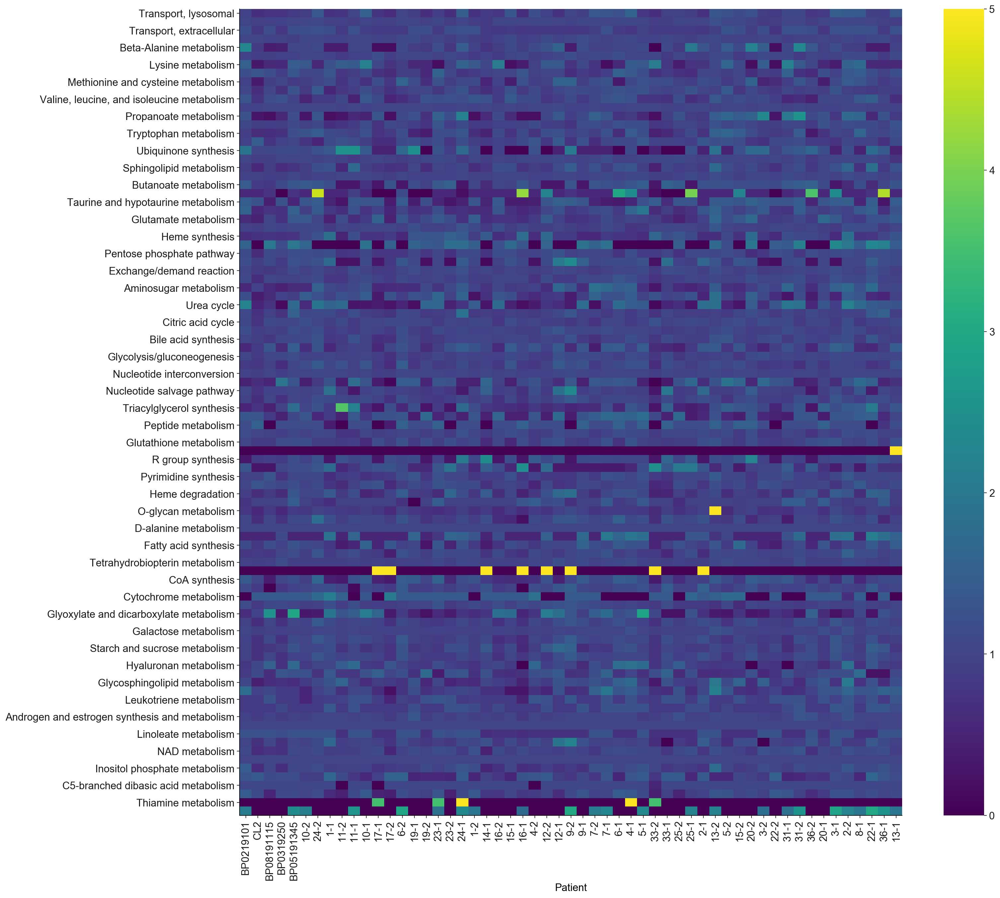

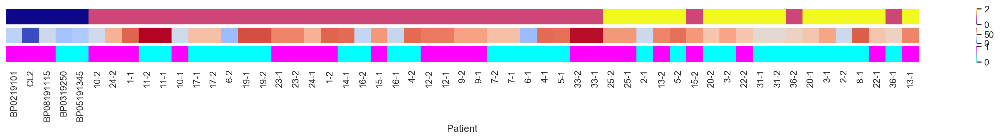

<Figure size 1280x24 with 0 Axes>

<Figure size 1280x24 with 0 Axes>

<Figure size 1280x24 with 0 Axes>

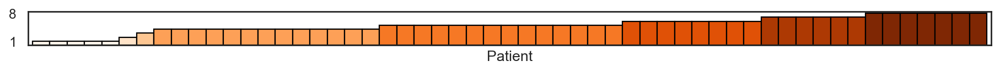

In [87]:
(df_p, sig_pathways, patients_WHO) = subsystem_plot(fluxes_cd8, 'cd8')

In [89]:
adata_obs_by_patient = fluxes_cd8.obs.copy().dropna(subset=['WHO_scale'])
adata_obs_by_patient['WHO_scale'] = adata_obs_by_patient['WHO_scale'].astype(int)

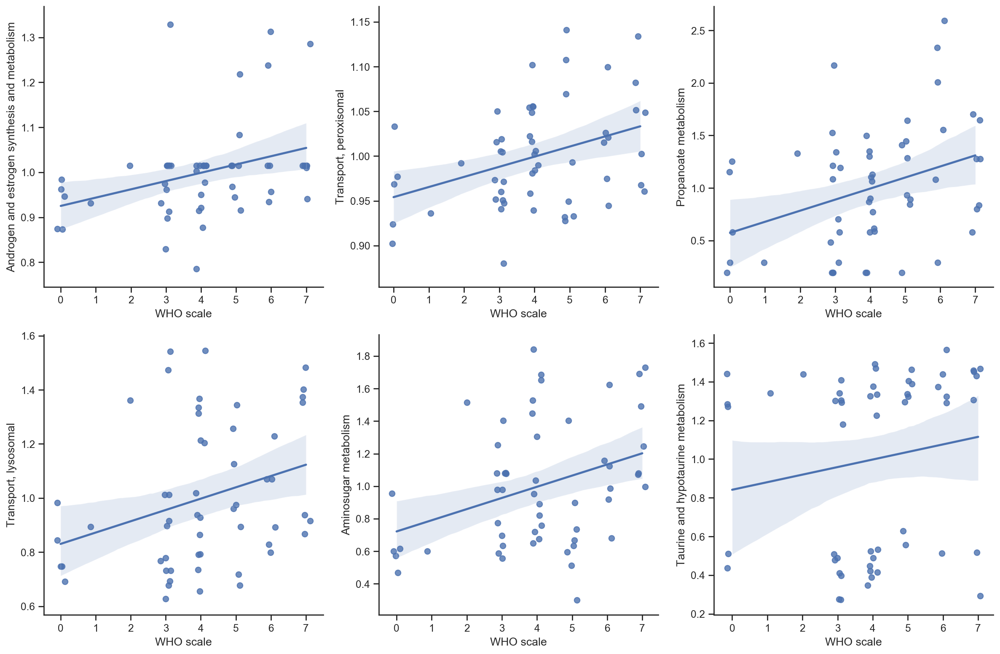

In [90]:
plot_sig_pathways(df_p, sig_pathways, patients_WHO)

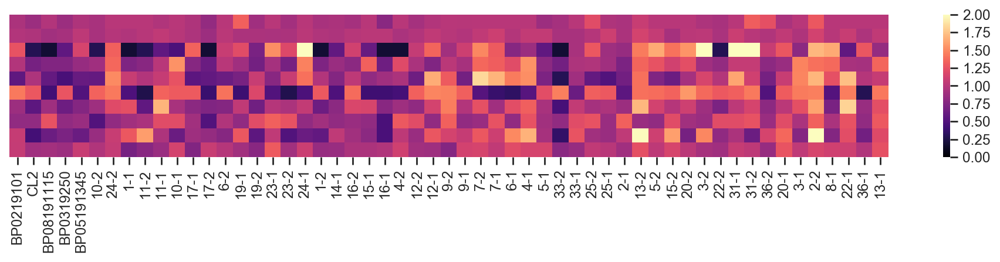

In [91]:
df_corresponding = plot_corresponding(df_p, sig_pathways, patients_WHO, cmap='magma', vmax=2, figsize=(15, 2))

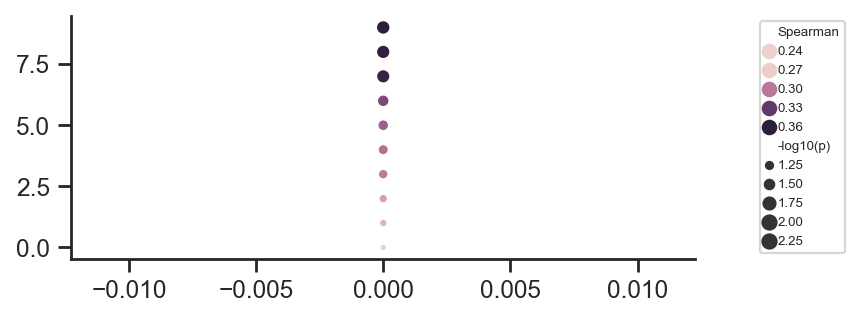

In [92]:
plot_spearman_dots(sig_pathways, df_corresponding, figsize=(5, 2))

### CD4

C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


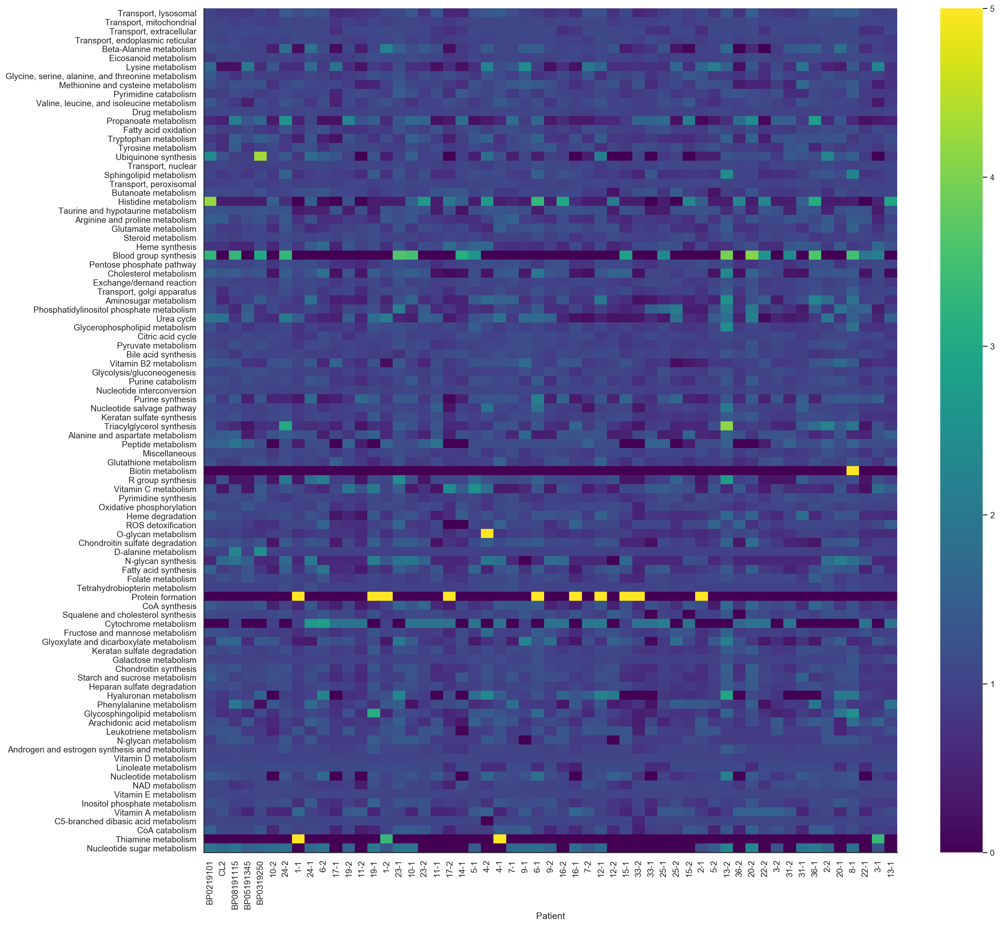

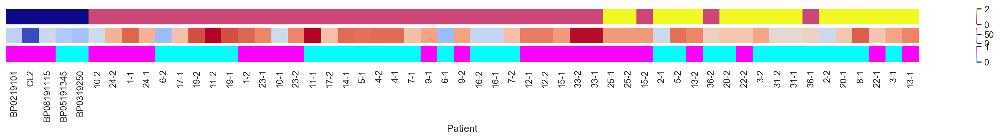

<Figure size 1280x24 with 0 Axes>

<Figure size 1280x24 with 0 Axes>

<Figure size 1280x24 with 0 Axes>

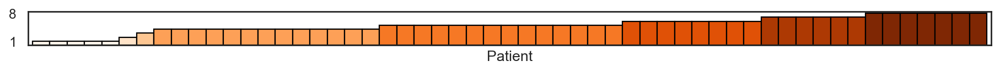

In [94]:
(df_p, sig_pathways, patients_WHO) = subsystem_plot(fluxes_cd4, 'cd4')

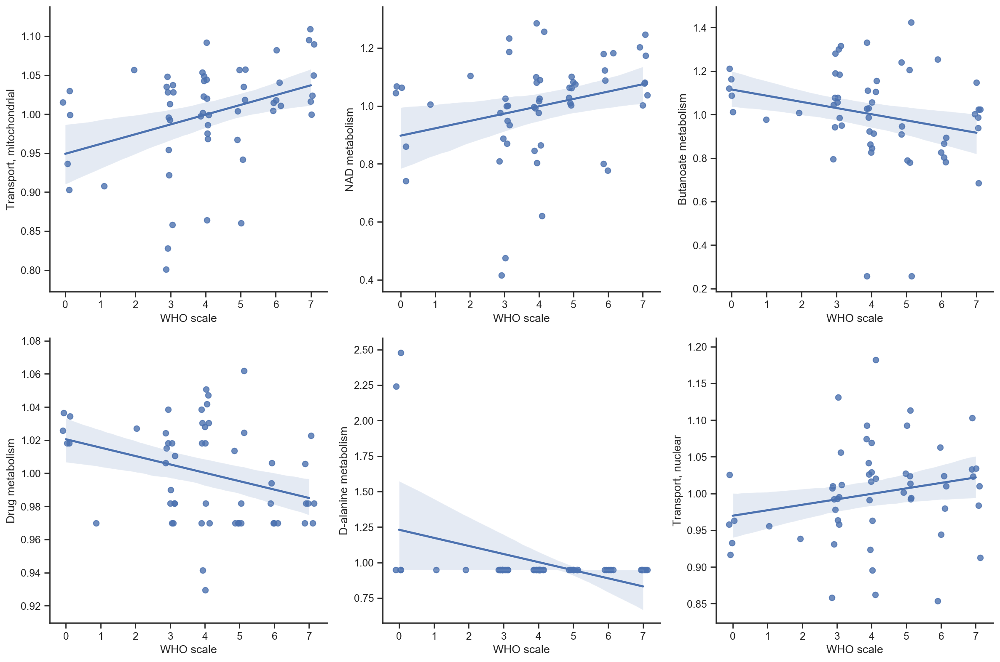

In [95]:
plot_sig_pathways(df_p, sig_pathways, patients_WHO)

In [96]:
# D-alanine metabolism is influenced by outlier
sig_pathways = sig_pathways.drop('D-alanine metabolism')

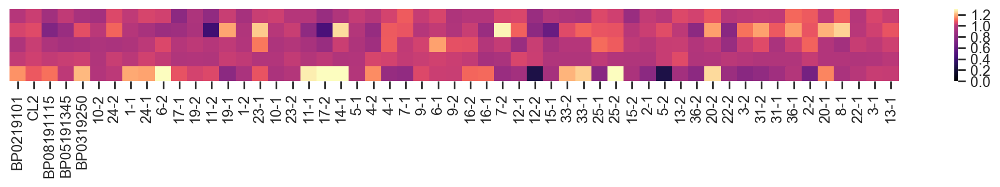

In [97]:
df_corresponding = plot_corresponding(df_p, sig_pathways, patients_WHO, cmap='magma', vmax=1.3, figsize=(15, 1))

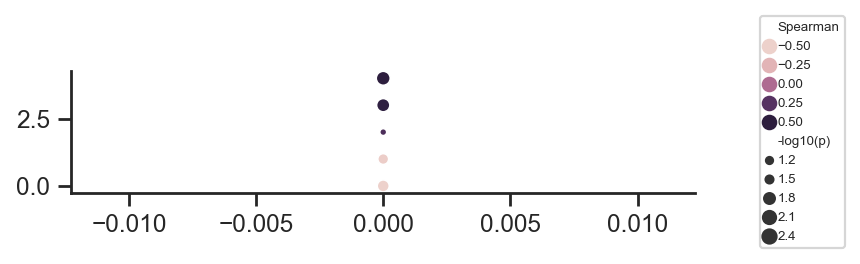

In [98]:
plot_spearman_dots(sig_pathways, df_corresponding, figsize=(5, 1))

### B

C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


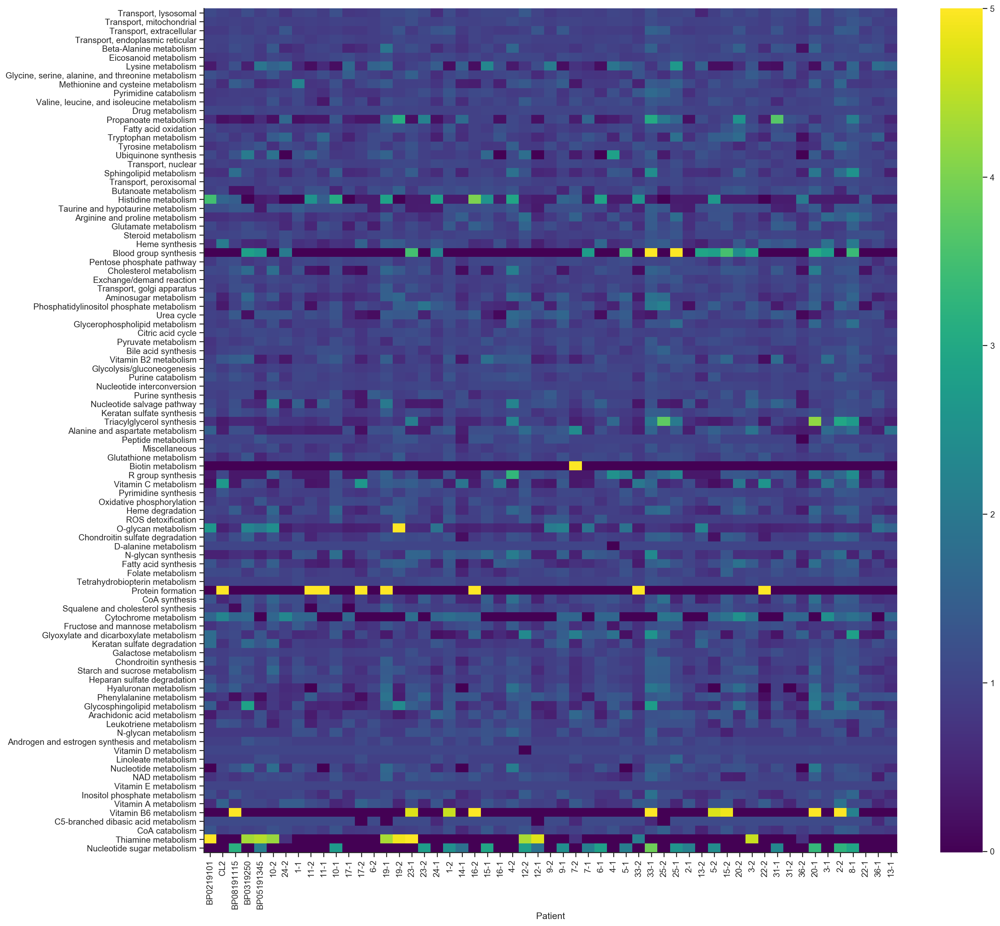

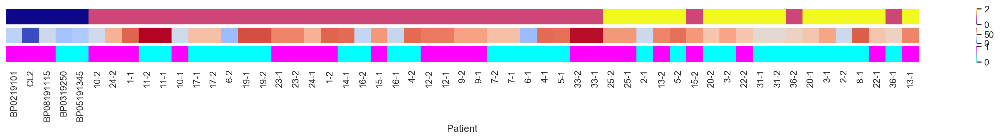

<Figure size 1280x24 with 0 Axes>

<Figure size 1280x24 with 0 Axes>

<Figure size 1280x24 with 0 Axes>

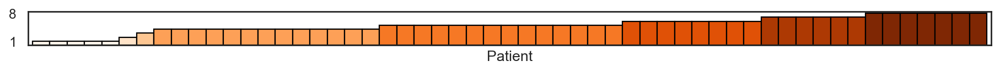

In [99]:
(df_p, sig_pathways, patients_WHO) = subsystem_plot(fluxes_b, 'B')

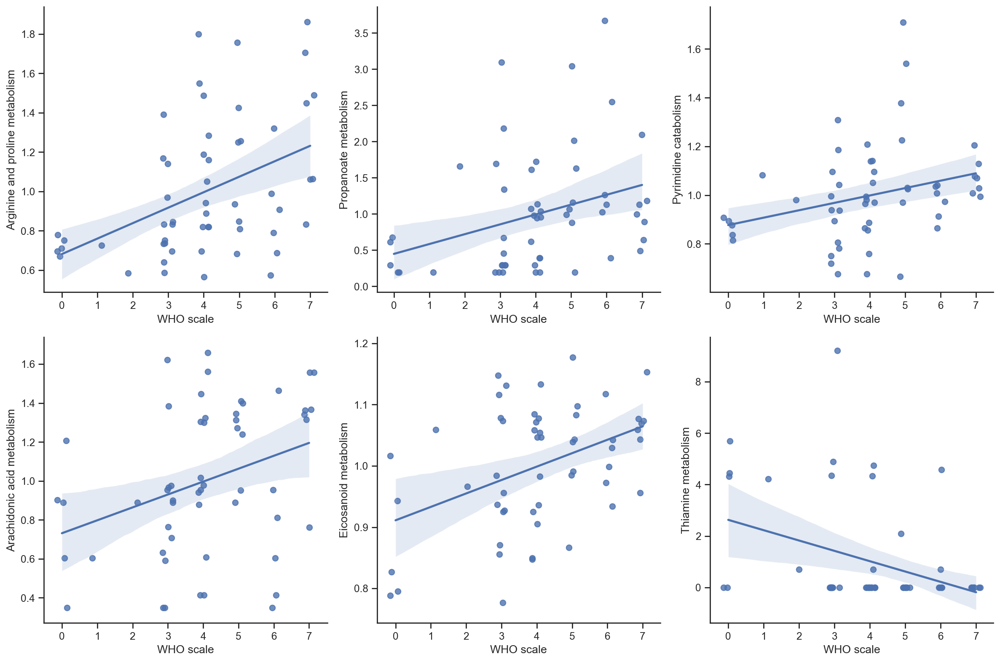

In [100]:
plot_sig_pathways(df_p, sig_pathways, patients_WHO)

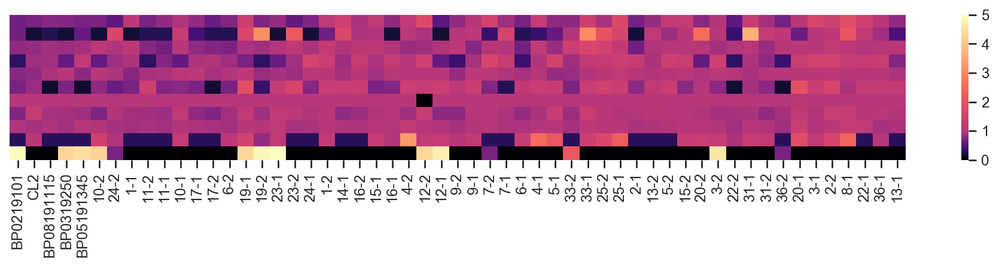

In [101]:
df_corresponding = plot_corresponding(df_p, sig_pathways, patients_WHO, cmap='magma', vmax=5, figsize=(15, 2))

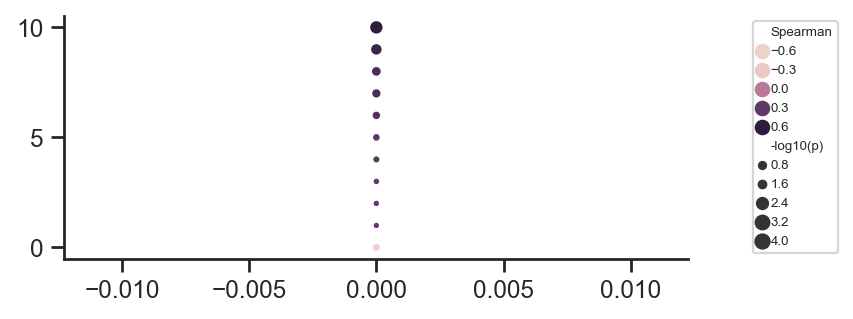

In [102]:
plot_spearman_dots(sig_pathways, df_corresponding, figsize=(5, 2))

### NK

C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


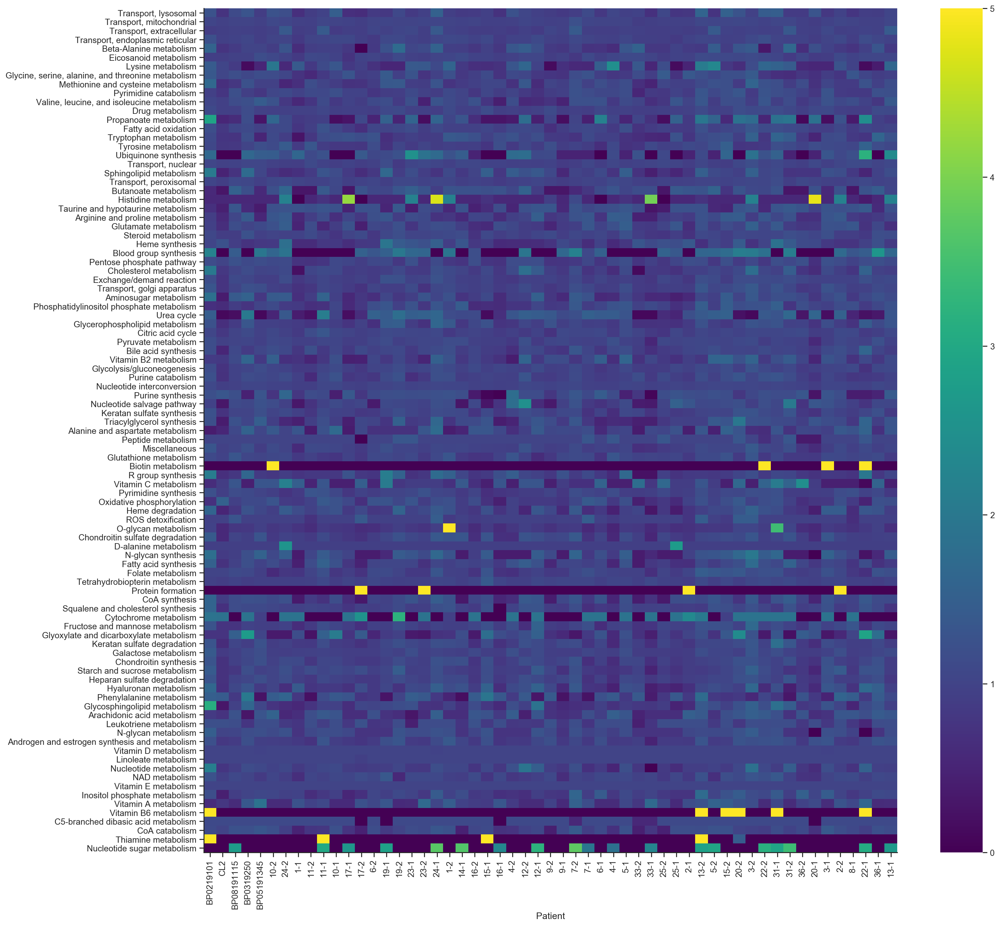

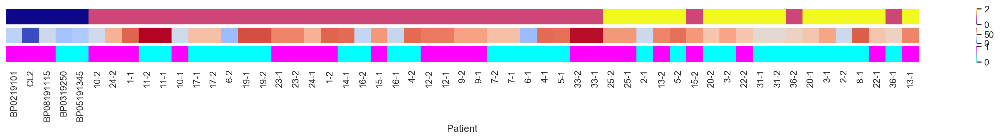

<Figure size 1280x24 with 0 Axes>

<Figure size 1280x24 with 0 Axes>

<Figure size 1280x24 with 0 Axes>

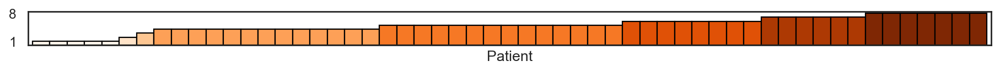

In [103]:
(df_p, sig_pathways, patients_WHO) = subsystem_plot(fluxes_nk, 'NK')

In [ ]:
plot_sig_pathways(df_p, sig_pathways, patients_WHO)

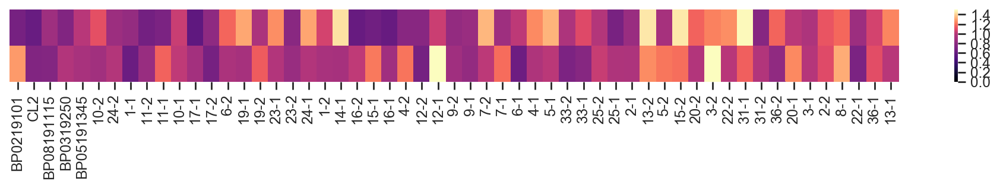

In [105]:
df_corresponding = plot_corresponding(df_p, sig_pathways, patients_WHO, cmap='magma', vmax=1.5, figsize=(15, 1))

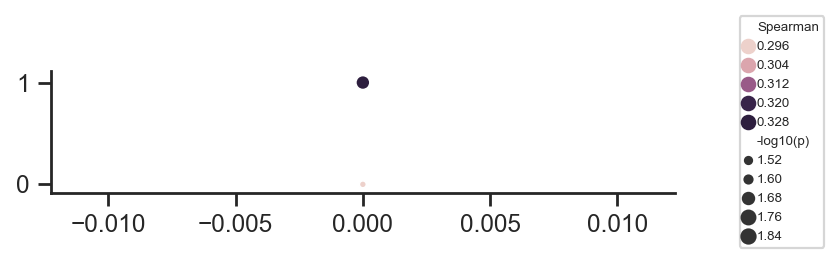

In [106]:
plot_spearman_dots(sig_pathways, df_corresponding, figsize=(5, 1))

### Monocyte

C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


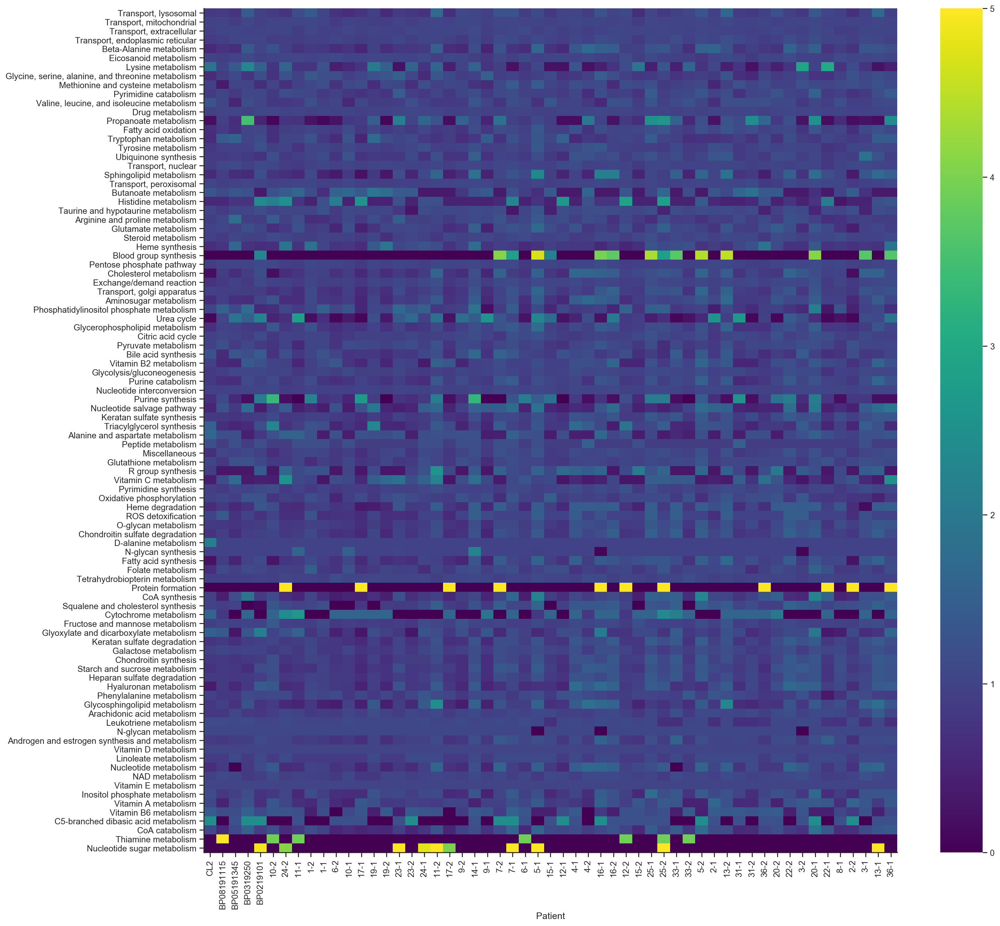

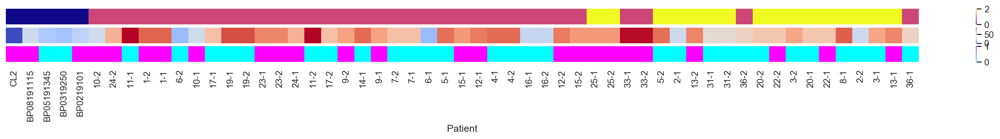

<Figure size 1280x24 with 0 Axes>

<Figure size 1280x24 with 0 Axes>

<Figure size 1280x24 with 0 Axes>

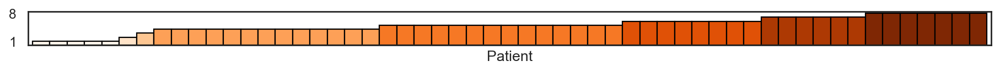

In [107]:
(df_p, sig_pathways, patients_WHO) = subsystem_plot(fluxes_mono, 'Monocyte')

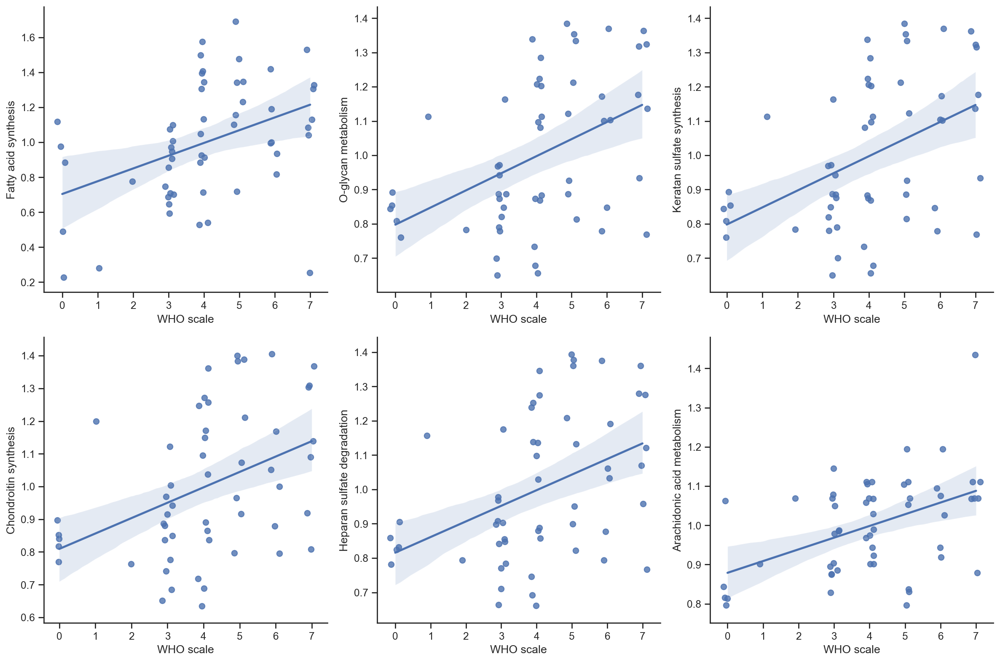

In [108]:
plot_sig_pathways(df_p, sig_pathways, patients_WHO)

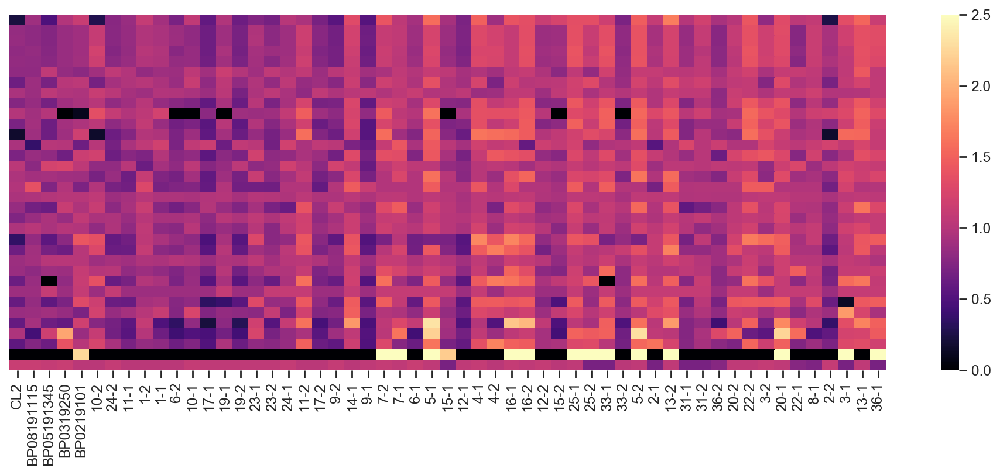

In [109]:
df_corresponding = plot_corresponding(df_p, sig_pathways, patients_WHO, cmap='magma', vmax=2.5, figsize=(15, 5))

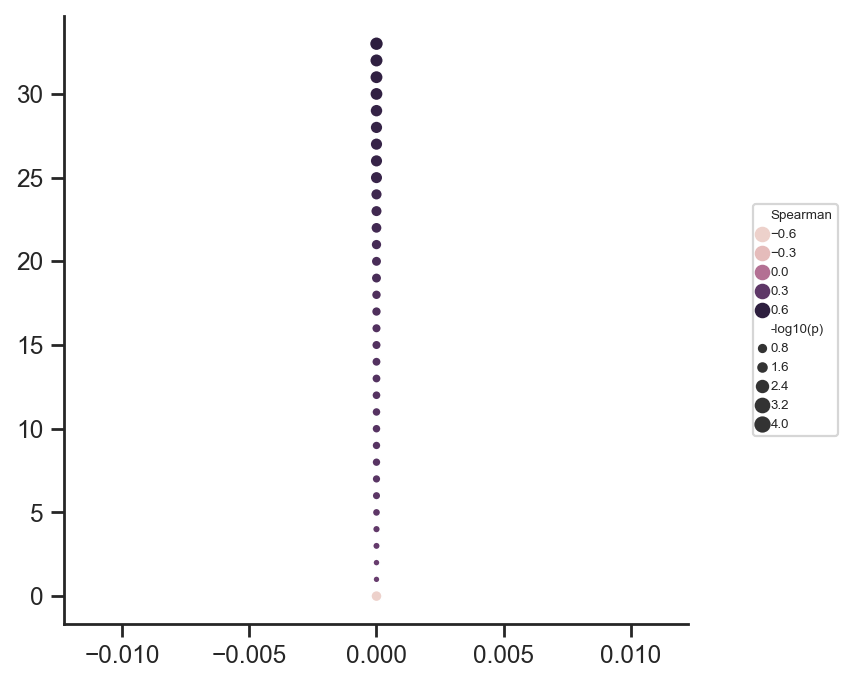

In [110]:
plot_spearman_dots(sig_pathways, df_corresponding, figsize=(5, 5))

### Overlap of individual cell type clusters per patient

In [ ]:
clusters_pt = pd.DataFrame(np.zeros([len(fluxes_pt.obs.index), 5]) - 1, 
                           columns=['CD4_cluster', 'CD8_cluster', 'B_cluster', 'NK_cluster', 'Monocyte_cluster'])
clusters_pt.index = fluxes_pt.obs.index
for i, celltype in enumerate([fluxes_cd4.obs, fluxes_cd8.obs, fluxes_b.obs, fluxes_nk.obs, fluxes_mono.obs]):
    celltype.index = celltype['Patient']
    
    if celltype['cell_type'][0]=='NK-cells': # One patient doesn't have NK cell samples
        pts = set(fluxes_pt.obs.index).intersection(set(celltype['Patient']))
        clusters_pt.loc[pts, 'NK_cluster'] = celltype.loc[pts, 'leiden']
    else:
        clusters_pt.iloc[:, i] = celltype.loc[clusters_pt.index, 'leiden']

In [ ]:
clusters_pt.to_csv(master_dir + 'output/flux_analysis/flux_clusters_pt.csv')

In [ ]:
set1 = set(clusters_pt[clusters_pt['CD4_cluster']=='0'].index)
set2 = set(clusters_pt[clusters_pt['CD8_cluster']=='0'].index)
set3 = set1.intersection(set2)
venn2(subsets = (len(set1) - len(set3), len(set2) - len(set3), len(set3)), set_labels = ('CD4 cluster 0', 'CD8 cluster 0'))

In [ ]:
set1 = set(clusters_pt[clusters_pt['CD4_cluster']=='0'].index)
set2 = set(clusters_pt[clusters_pt['CD8_cluster']=='1'].index)
set3 = set1.intersection(set2)
venn2(subsets = (len(set1) - len(set3), len(set2) - len(set3), len(set3)), set_labels = ('CD4 cluster 0', 'CD8 cluster 0'))

In [ ]:
set1 = set(clusters_pt[clusters_pt['B_cluster']=='1'].index)
set2 = set(clusters_pt[clusters_pt['CD8_cluster']=='0'].index)
set3 = set1.intersection(set2)
venn2(subsets = (len(set1) - len(set3), len(set2) - len(set3), len(set3)), set_labels = ('CD4 cluster 0', 'CD8 cluster 0'))